# Measuring <font color='red'>Phenotype</font> in OpenSAFELY-TPP
This short report describes how <font color='red'>phenotype</font> can be identified in the OpenSAFELY-TPP database, and the strengths and weaknesses of the methods. This is a living document that will be updated to reflect changes to the OpenSAFELY-TPP database and the patient records within.

## OpenSAFELY
OpenSAFELY is an analytics platform for conducting analyses on Electronic Health Records inside the secure environment where the records are held. This has multiple benefits: 

* We don't transport large volumes of potentially disclosive pseudonymised patient data outside of the secure environments for analysis
* Analyses can run in near real-time as records are ready for analysis as soon as they appear in the secure environment
* All infrastructure and analysis code is stored in GitHub repositories, which are open for security review, scientific review, and re-use

A key feature of OpenSAFELY is the use of study definitions, which are formal specifications of the datasets to be generated from the OpenSAFELY database. This takes care of much of the complex EHR data wrangling required to create a dataset in an analysis-ready format. It also creates a library of standardised and validated variable definitions that can be deployed consistently across multiple projects. 

The purpose of this report is to describe all such variables that relate to <font color='red'>phenotype</font>, their relative strengths and weaknesses, in what scenarios they are best deployed. It will also describe potential future definitions that have not yet been implemented.

## Available Records
OpenSAFELY-TPP runs inside TPP’s data centre which contains the primary care records for all patients registered at practices using TPP’s SystmOne Clinical Information System. This data centre also imports external datasets from other sources, including A&E attendances and hospital admissions from NHS Digital’s Secondary Use Service, and death registrations from the ONS. More information on available data sources can be found within the OpenSAFELY documentation. 

In [1]:
from IPython.display import display, Markdown
from report_functions import *

In [2]:
### CONFIGURE OPTIONS HERE ###

# Import file
input_path = '../output/data/input_all.feather'

# Definitions
definitions = ['derived_bmi', 'computed_bmi', 'recorded_bmi']

# Dates
date_min = '2019-01-01'
date_max = '2019-12-31'
time_delta = 'M'

# Min/max range
min_range = 4
max_range = 200

# Null value – 0 or NA
null = 0

# Covariates
demographic_covariates = ['age_band', 'sex', 'ethnicity', 'region', 'imd']
clinical_covariates = ['dementia', 'diabetes', 'hypertension', 'learning_disability']

In [3]:
# Preprocess data with configurations above
num_definitions = len(definitions)
df_occ = preprocess_data(input_path, definitions, demographic_covariates, clinical_covariates, date_min, date_max, time_delta, num_definitions, null)

_______
## Descriptive Statistics

### Occurrence

#### Unique Patients by Definition

In [4]:
count_unique(df_occ, definitions, time_delta, 'patient')

,counts
pat_derived_bmi,20050.0
pat_computed_bmi,15975.0
pat_recorded_bmi,20010.0
pat_both_derived_bmi_computed_bmi,20025.0
pat_both_derived_bmi_recorded_bmi,24995.0
pat_both_computed_bmi_recorded_bmi,20025.0
pat_all_filled,10295.0
pat_all_missing,340.0


In [5]:
for group in demographic_covariates:
    count_unique(df_occ, definitions, time_delta, 'patient', group)

,pat_derived_bmi,pat_computed_bmi,pat_recorded_bmi,pat_both_derived_bmi_computed_bmi,pat_both_derived_bmi_recorded_bmi,pat_both_computed_bmi_recorded_bmi,pat_all_filled,pat_all_missing
age_band,,,,,,,,
0-19,1385.0,1095.0,1415.0,1380.0,1765.0,1380.0,695.0,25.0
20-29,1380.0,1080.0,1355.0,1365.0,1700.0,1365.0,710.0,20.0
30-39,1285.0,1020.0,1285.0,1290.0,1625.0,1290.0,630.0,30.0
40-49,1290.0,1060.0,1295.0,1325.0,1620.0,1325.0,660.0,25.0
50-59,1470.0,1185.0,1445.0,1460.0,1810.0,1460.0,785.0,20.0
60-69,1480.0,1190.0,1410.0,1465.0,1795.0,1465.0,770.0,25.0
70-79,1355.0,1055.0,1395.0,1325.0,1700.0,1325.0,700.0,25.0
80+,1340.0,1090.0,1400.0,1370.0,1690.0,1370.0,735.0,25.0


,pat_derived_bmi,pat_computed_bmi,pat_recorded_bmi,pat_both_derived_bmi_computed_bmi,pat_both_derived_bmi_recorded_bmi,pat_both_computed_bmi_recorded_bmi,pat_all_filled,pat_all_missing
sex,,,,,,,,
F,7385.0,5860.0,7295.0,7310.0,9140.0,7310.0,3805.0,115.0
M,7535.0,6040.0,7585.0,7560.0,9450.0,7560.0,3860.0,145.0


,pat_derived_bmi,pat_computed_bmi,pat_recorded_bmi,pat_both_derived_bmi_computed_bmi,pat_both_derived_bmi_recorded_bmi,pat_both_computed_bmi_recorded_bmi,pat_all_filled,pat_all_missing
ethnicity,,,,,,,,
1,1085.0,855.0,1070.0,1085.0,1350.0,1085.0,570.0,10.0
2,480.0,395.0,515.0,495.0,620.0,495.0,270.0,10.0
3,260.0,220.0,275.0,275.0,350.0,275.0,120.0,-
4,150.0,125.0,150.0,155.0,185.0,155.0,95.0,-
5,125.0,110.0,140.0,130.0,160.0,130.0,70.0,-
6,35.0,20.0,30.0,30.0,40.0,30.0,15.0,-
7,-,-,-,-,-,-,-,-
8,5.0,10.0,15.0,10.0,15.0,10.0,-,-


,pat_derived_bmi,pat_computed_bmi,pat_recorded_bmi,pat_both_derived_bmi_computed_bmi,pat_both_derived_bmi_recorded_bmi,pat_both_computed_bmi_recorded_bmi,pat_all_filled,pat_all_missing
region,,,,,,,,
East Midlands,690.0,550.0,680.0,680.0,850.0,680.0,360.0,10.0
East of England,640.0,495.0,625.0,610.0,785.0,610.0,335.0,10.0
London,1355.0,1075.0,1365.0,1340.0,1705.0,1340.0,695.0,25.0
North East,665.0,550.0,680.0,695.0,870.0,695.0,335.0,15.0
North West,690.0,575.0,700.0,715.0,875.0,715.0,375.0,15.0
South East,1460.0,1165.0,1490.0,1475.0,1835.0,1475.0,735.0,25.0
West Midlands,690.0,540.0,680.0,680.0,845.0,680.0,360.0,15.0
Yorkshire and the Humber,620.0,495.0,630.0,620.0,795.0,620.0,300.0,5.0


,pat_derived_bmi,pat_computed_bmi,pat_recorded_bmi,pat_both_derived_bmi_computed_bmi,pat_both_derived_bmi_recorded_bmi,pat_both_computed_bmi_recorded_bmi,pat_all_filled,pat_all_missing
imd,,,,,,,,
100,2265.0,1805.0,2240.0,2240.0,2805.0,2240.0,1170.0,40.0
200,2350.0,1895.0,2330.0,2355.0,2925.0,2355.0,1235.0,40.0
300,2355.0,1915.0,2365.0,2400.0,2960.0,2400.0,1215.0,45.0
400,2330.0,1835.0,2345.0,2340.0,2970.0,2340.0,1155.0,45.0
500,2380.0,1890.0,2400.0,2370.0,2955.0,2370.0,1235.0,35.0


In [6]:
for group in clinical_covariates:
    count_unique(df_occ, definitions, time_delta, 'patient', group)

,pat_derived_bmi,pat_computed_bmi,pat_recorded_bmi,pat_both_derived_bmi_computed_bmi,pat_both_derived_bmi_recorded_bmi,pat_both_computed_bmi_recorded_bmi,pat_all_filled,pat_all_missing
dementia,,,,,,,,
False,19770,15740,19730,19730,24630,19730,10160,335.0
True,95,80,90,100,120,100,45,-


,pat_derived_bmi,pat_computed_bmi,pat_recorded_bmi,pat_both_derived_bmi_computed_bmi,pat_both_derived_bmi_recorded_bmi,pat_both_computed_bmi_recorded_bmi,pat_all_filled,pat_all_missing
diabetes,,,,,,,,
False,19745,15720,19715,19720,24620,19720,10135,340.0
True,105,85,95,95,120,95,60,-


,pat_derived_bmi,pat_computed_bmi,pat_recorded_bmi,pat_both_derived_bmi_computed_bmi,pat_both_derived_bmi_recorded_bmi,pat_both_computed_bmi_recorded_bmi,pat_all_filled,pat_all_missing
hypertension,,,,,,,,
False,19760,15760,19735,19735,24640,19735,10160,340.0
True,95,75,95,95,120,95,45,-


,pat_derived_bmi,pat_computed_bmi,pat_recorded_bmi,pat_both_derived_bmi_computed_bmi,pat_both_derived_bmi_recorded_bmi,pat_both_computed_bmi_recorded_bmi,pat_all_filled,pat_all_missing
learning_disability,,,,,,,,
False,19735,15730,19685,19705,24600,19705,10125,330.0
True,95,75,100,100,120,100,55,-


#### Unique Patients Over Time

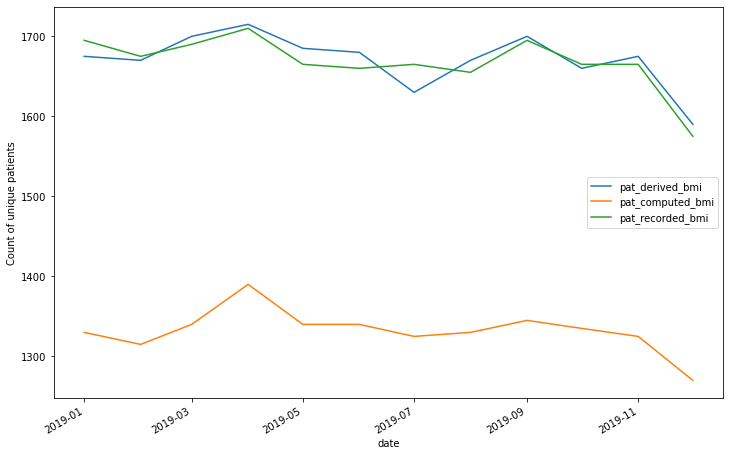

In [7]:
report_over_time(df_occ, definitions, 'patient')

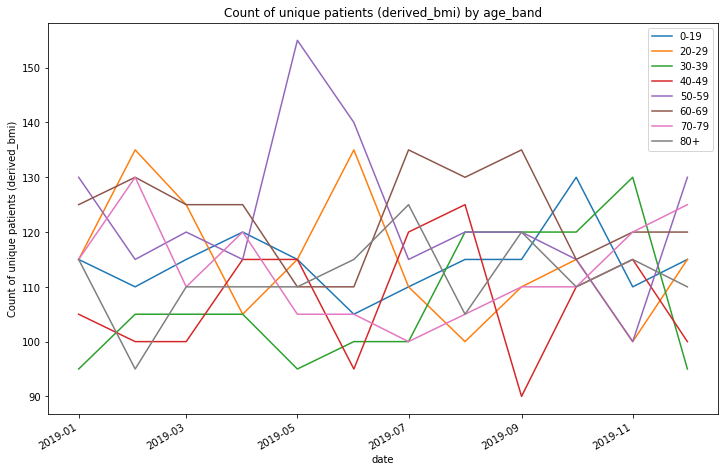

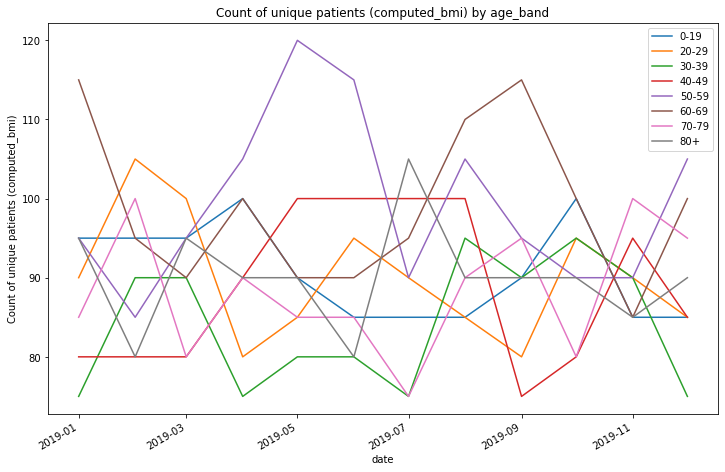

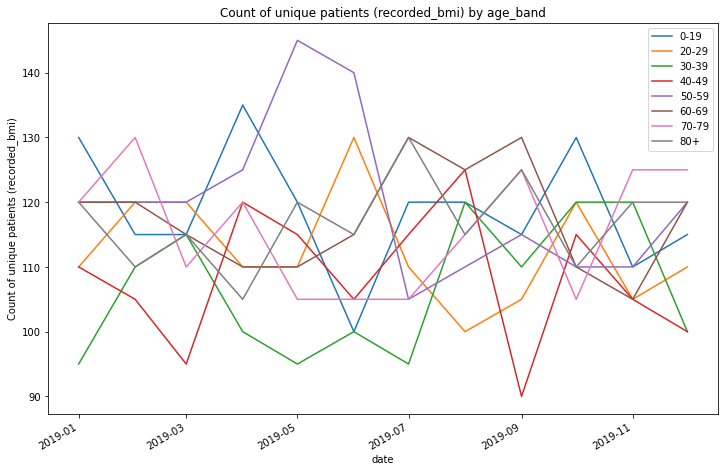

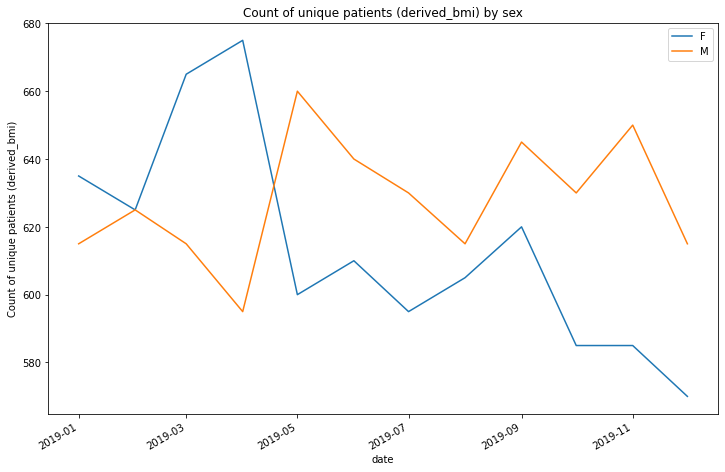

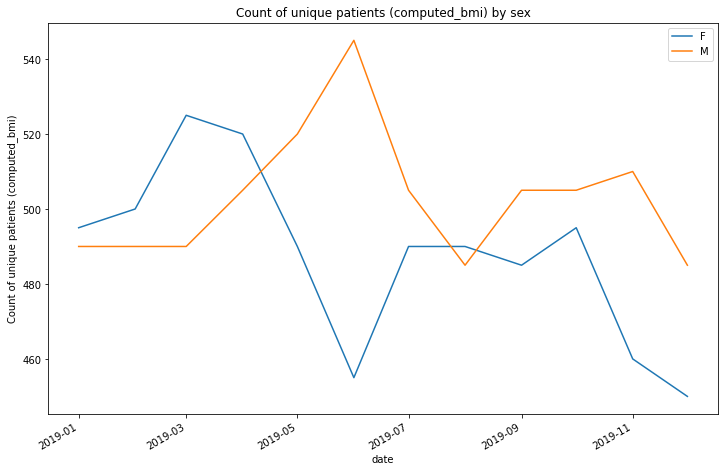

...

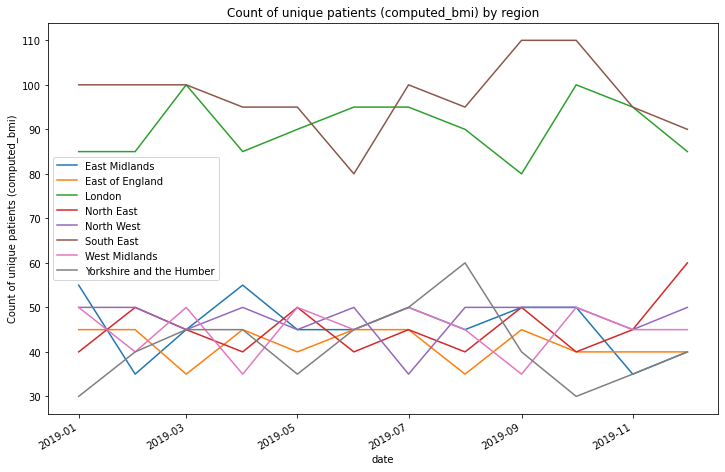

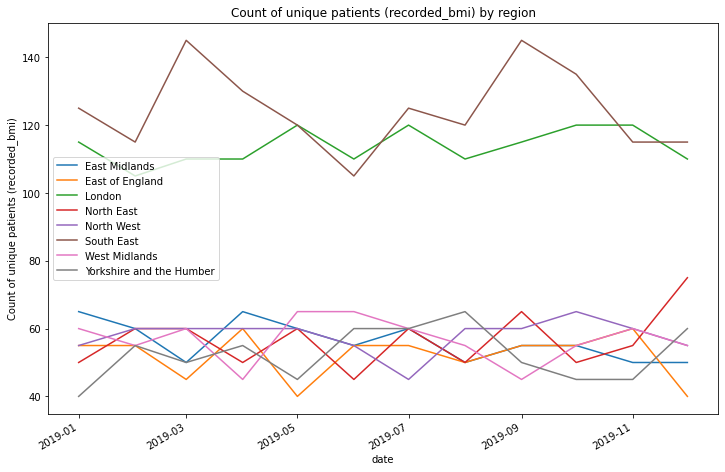

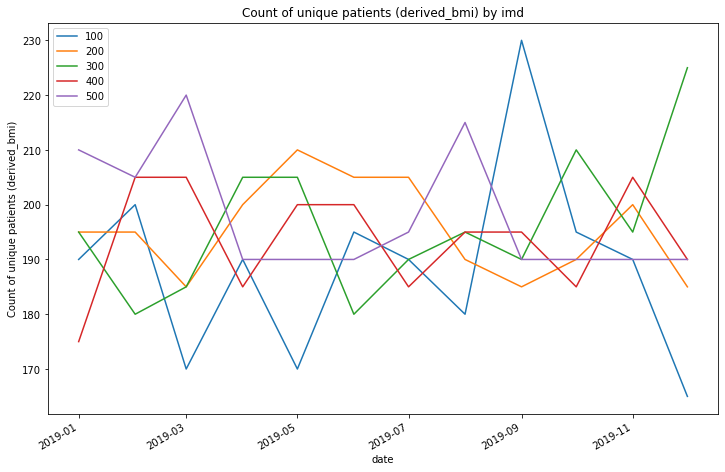

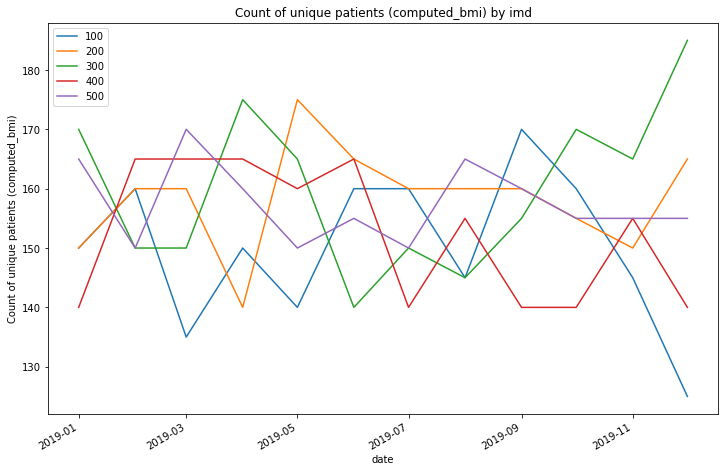

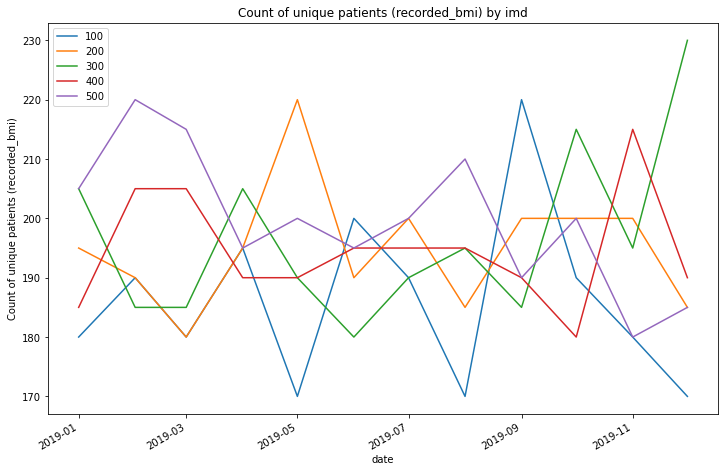

In [8]:
for group in demographic_covariates:
    report_over_time(df_occ, definitions, 'patient', group)

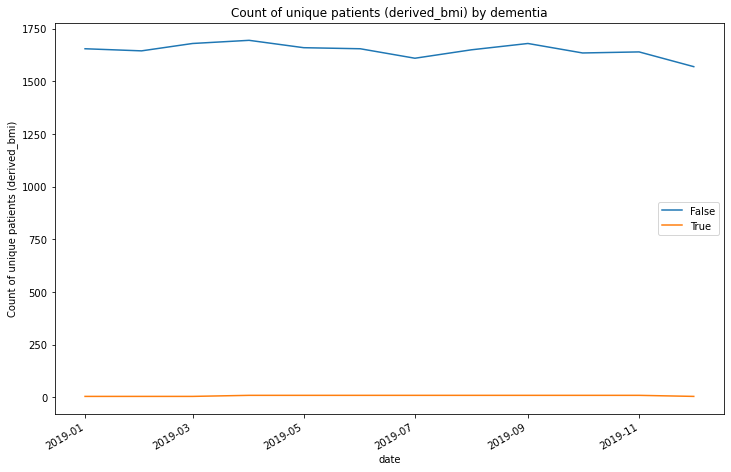

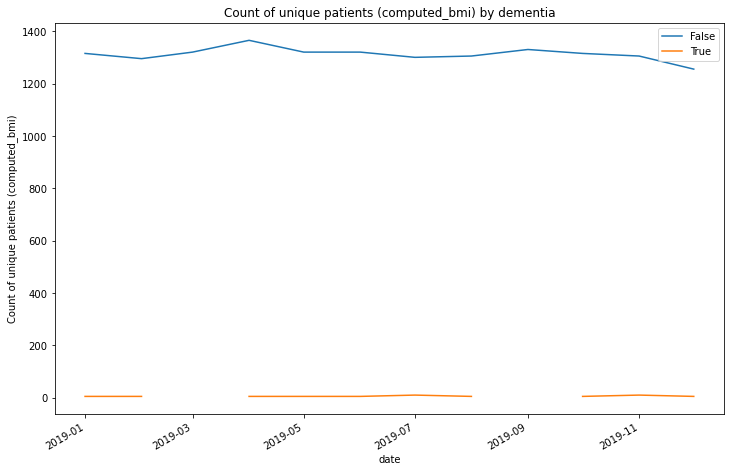

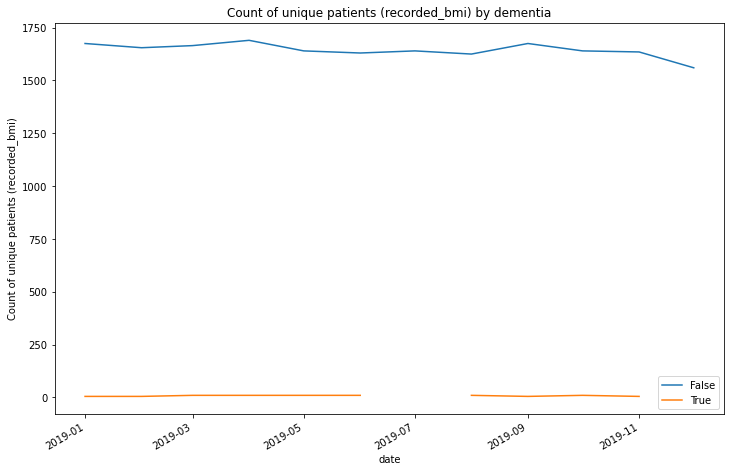

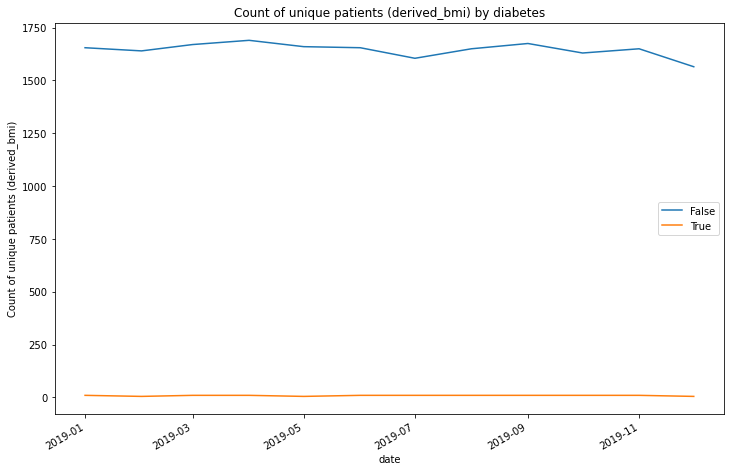

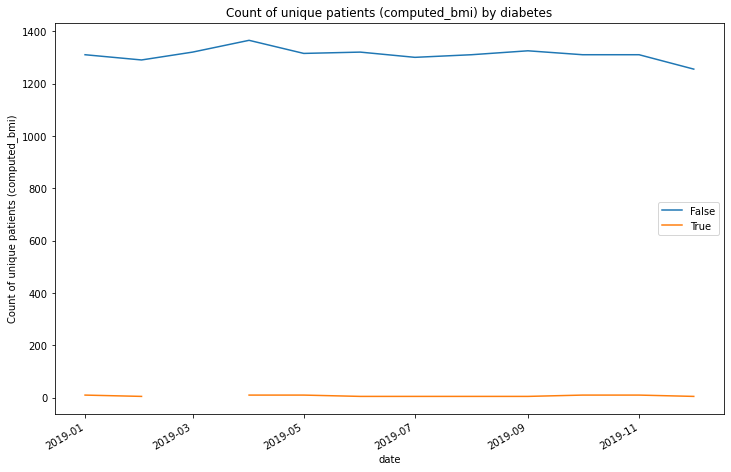

...

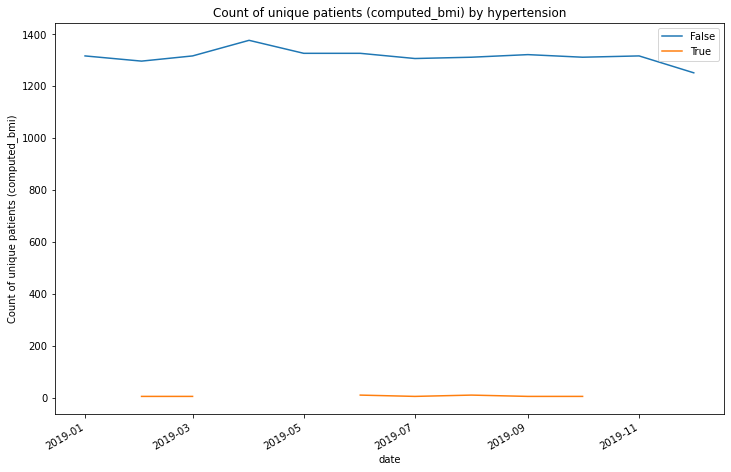

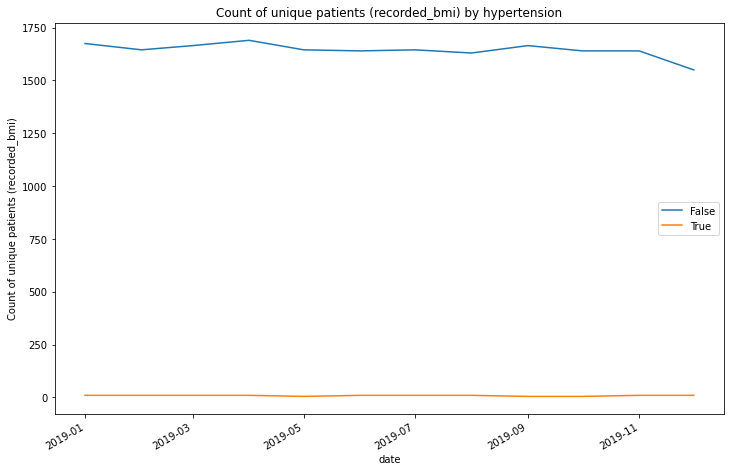

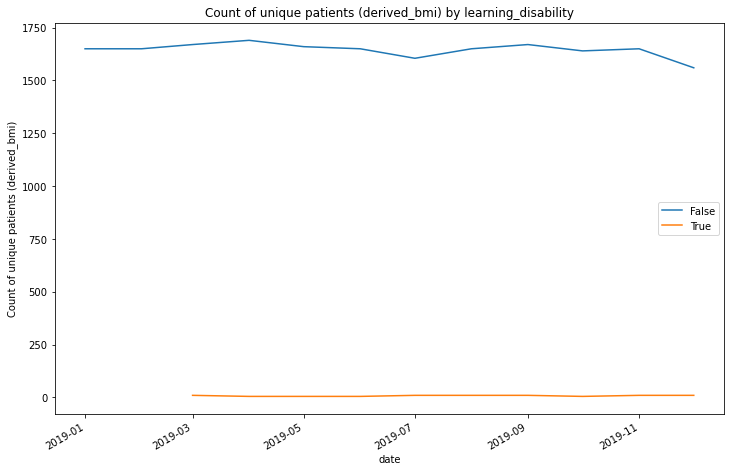

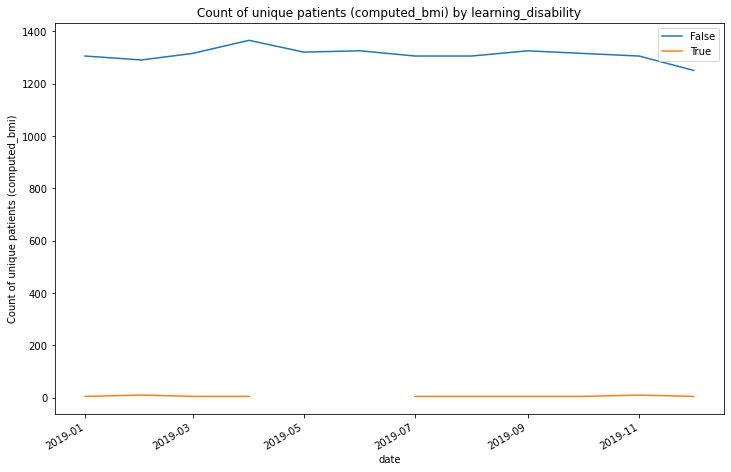

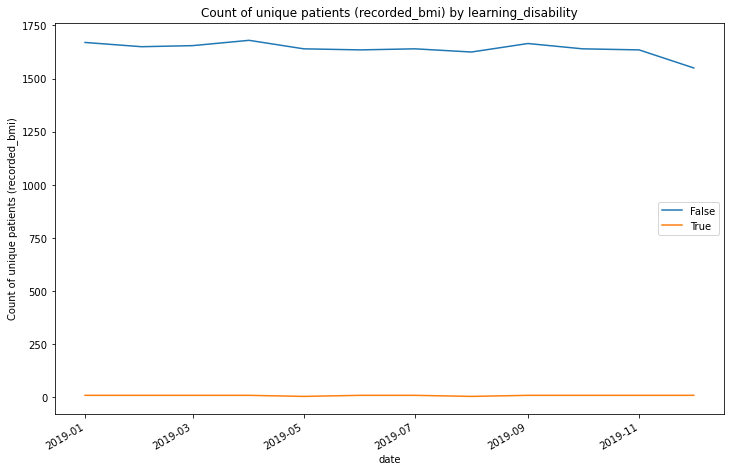

In [9]:
for group in clinical_covariates:
    report_over_time(df_occ, definitions, 'patient', group)

#### Unique Measurements by Definition

In [10]:
count_unique(df_occ, definitions, time_delta, 'measurement')

,counts
meas_derived_bmi,9612000.0
meas_computed_bmi,7686000.0
meas_recorded_bmi,9612000.0
meas_both_derived_bmi_computed_bmi,9612000.0
meas_both_derived_bmi_recorded_bmi,12000000.0
meas_both_computed_bmi_recorded_bmi,9612000.0
meas_all_filled,4964000.0
meas_all_missing,168000.0


In [11]:
for group in demographic_covariates:
    count_unique(df_occ, definitions, time_delta, 'measurement', group)

,meas_derived_bmi,meas_computed_bmi,meas_recorded_bmi,meas_both_derived_bmi_computed_bmi,meas_both_derived_bmi_recorded_bmi,meas_both_computed_bmi_recorded_bmi,meas_all_filled,meas_all_missing
age_band,,,,,,,,
0-19,158125.0,124050.0,161595.0,157540.0,201630.0,157540.0,78900.0,2960.0
20-29,151975.0,119475.0,149060.0,150325.0,188130.0,150325.0,77160.0,1955.0
30-39,141405.0,112905.0,140805.0,141765.0,177560.0,141765.0,70385.0,3175.0
40-49,135215.0,111300.0,135655.0,139445.0,170705.0,139445.0,68515.0,2345.0
50-59,165115.0,135515.0,161710.0,165370.0,204260.0,165370.0,88380.0,2585.0
60-69,165965.0,133560.0,157495.0,165230.0,201490.0,165230.0,86540.0,2575.0
70-79,146415.0,112480.0,150750.0,141485.0,183000.0,141485.0,74625.0,2755.0
80+,146015.0,117620.0,152025.0,148230.0,183395.0,148230.0,79915.0,2615.0


,meas_derived_bmi,meas_computed_bmi,meas_recorded_bmi,meas_both_derived_bmi_computed_bmi,meas_both_derived_bmi_recorded_bmi,meas_both_computed_bmi_recorded_bmi,meas_all_filled,meas_all_missing
sex,,,,,,,,
F,2381955.0,1889920.0,2356370.0,2355580.0,2946285.0,2355580.0,1230050.0,37625.0
M,2427815.0,1955700.0,2452225.0,2454435.0,3058285.0,2454435.0,1252820.0,46350.0


,meas_derived_bmi,meas_computed_bmi,meas_recorded_bmi,meas_both_derived_bmi_computed_bmi,meas_both_derived_bmi_recorded_bmi,meas_both_computed_bmi_recorded_bmi,meas_all_filled,meas_all_missing
ethnicity,,,,,,,,
1,27835.0,22120.0,27685.0,28125.0,35235.0,28125.0,14145.0,395.0
2,5645.0,4610.0,5830.0,5800.0,7270.0,5800.0,3180.0,175.0
3,1570.0,1375.0,1700.0,1765.0,2145.0,1765.0,740.0,35.0
4,495.0,450.0,505.0,525.0,605.0,525.0,325.0,-
5,265.0,230.0,295.0,280.0,340.0,280.0,155.0,-
6,35.0,15.0,30.0,25.0,40.0,25.0,15.0,-
7,-,-,-,-,-,-,-,-
8,5.0,5.0,10.0,10.0,10.0,10.0,-,-


,meas_derived_bmi,meas_computed_bmi,meas_recorded_bmi,meas_both_derived_bmi_computed_bmi,meas_both_derived_bmi_recorded_bmi,meas_both_computed_bmi_recorded_bmi,meas_all_filled,meas_all_missing
region,,,,,,,,
East Midlands,41790.0,33610.0,41280.0,41655.0,51585.0,41655.0,22045.0,805.0
East of England,37575.0,29160.0,36860.0,36000.0,45980.0,36000.0,19570.0,630.0
London,151275.0,121330.0,151900.0,150295.0,190610.0,150295.0,77385.0,2950.0
North East,41985.0,34315.0,42555.0,43680.0,54765.0,43680.0,21170.0,975.0
North West,45000.0,36885.0,45005.0,46250.0,57015.0,46250.0,23900.0,820.0
South East,172955.0,136425.0,175120.0,174200.0,217195.0,174200.0,86310.0,2835.0
West Midlands,44230.0,34270.0,42965.0,43185.0,53850.0,43185.0,22895.0,885.0
Yorkshire and the Humber,35720.0,28485.0,35935.0,35825.0,45570.0,35825.0,17210.0,375.0


,meas_derived_bmi,meas_computed_bmi,meas_recorded_bmi,meas_both_derived_bmi_computed_bmi,meas_both_derived_bmi_recorded_bmi,meas_both_computed_bmi_recorded_bmi,meas_all_filled,meas_all_missing
imd,,,,,,,,
100,356840.0,285960.0,352855.0,352485.0,441915.0,352485.0,184455.0,5485.0
200,388220.0,312195.0,386195.0,389575.0,483600.0,389575.0,205140.0,6620.0
300,397345.0,319980.0,396630.0,400595.0,494335.0,400595.0,204575.0,7305.0
400,386595.0,306775.0,389580.0,388465.0,490705.0,388465.0,194460.0,7915.0
500,399895.0,317040.0,403765.0,397775.0,497650.0,397775.0,207165.0,6375.0


In [12]:
for group in clinical_covariates:
    count_unique(df_occ, definitions, time_delta, 'measurement', group)

,meas_derived_bmi,meas_computed_bmi,meas_recorded_bmi,meas_both_derived_bmi_computed_bmi,meas_both_derived_bmi_recorded_bmi,meas_both_computed_bmi_recorded_bmi,meas_all_filled,meas_all_missing
dementia,,,,,,,,
False,9424800.0,7530930.0,9428760.0,9419850.0,11761200.0,9419850.0,4871790.0,163350.0
True,920.0,790.0,880.0,970.0,1200.0,970.0,430.0,30.0


,meas_derived_bmi,meas_computed_bmi,meas_recorded_bmi,meas_both_derived_bmi_computed_bmi,meas_both_derived_bmi_recorded_bmi,meas_both_computed_bmi_recorded_bmi,meas_all_filled,meas_all_missing
diabetes,,,,,,,,
False,9412920,7524000,9420840,9420840,11761200,9420840,4856940,166320.0
True,1040,860,960,960,1200,960,580,-


,meas_derived_bmi,meas_computed_bmi,meas_recorded_bmi,meas_both_derived_bmi_computed_bmi,meas_both_derived_bmi_recorded_bmi,meas_both_computed_bmi_recorded_bmi,meas_all_filled,meas_all_missing
hypertension,,,,,,,,
False,9421830.0,7535880.0,9422820.0,9421830.0,11761200.0,9421830.0,4869810.0,165330.0
True,950.0,740.0,940.0,950.0,1200.0,950.0,450.0,10.0


,meas_derived_bmi,meas_computed_bmi,meas_recorded_bmi,meas_both_derived_bmi_computed_bmi,meas_both_derived_bmi_recorded_bmi,meas_both_computed_bmi_recorded_bmi,meas_all_filled,meas_all_missing
learning_disability,,,,,,,,
False,9419850.0,7533900.0,9416880.0,9418860.0,11761200.0,9418860.0,4858920.0,162360.0
True,970.0,760.0,1000.0,980.0,1200.0,980.0,560.0,40.0


#### Unique Measurements Over Time

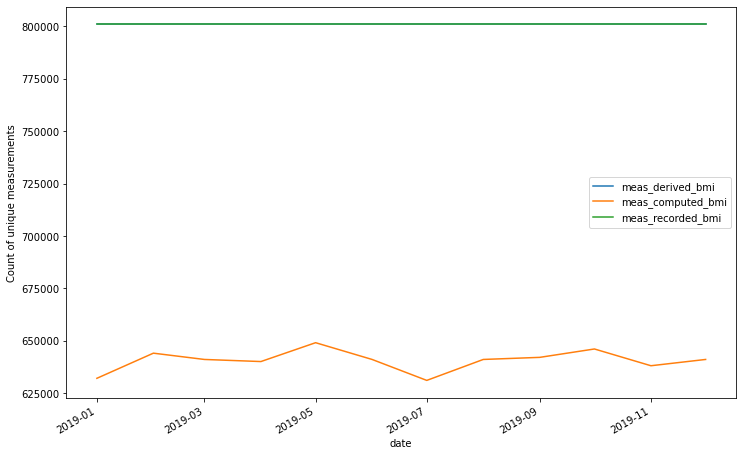

In [13]:
report_over_time(df_occ, definitions, 'measurement')

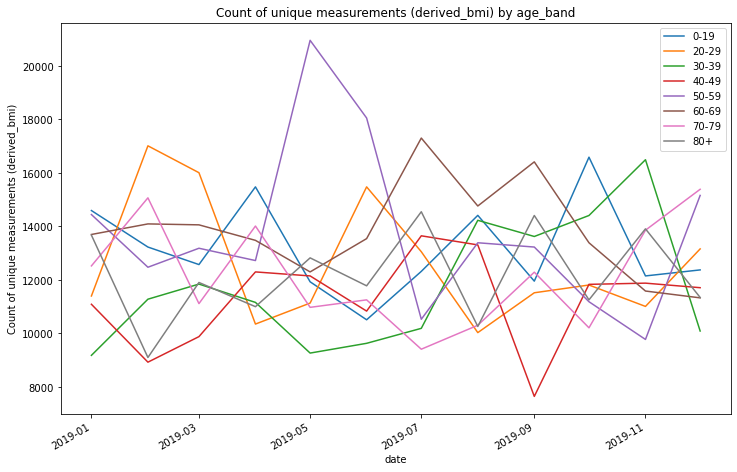

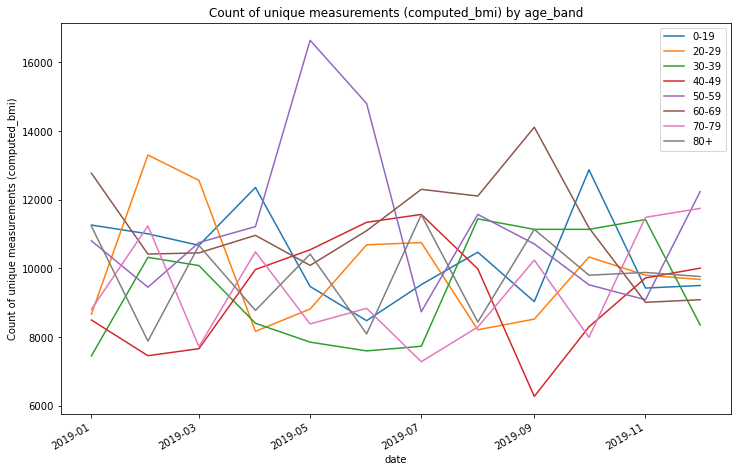

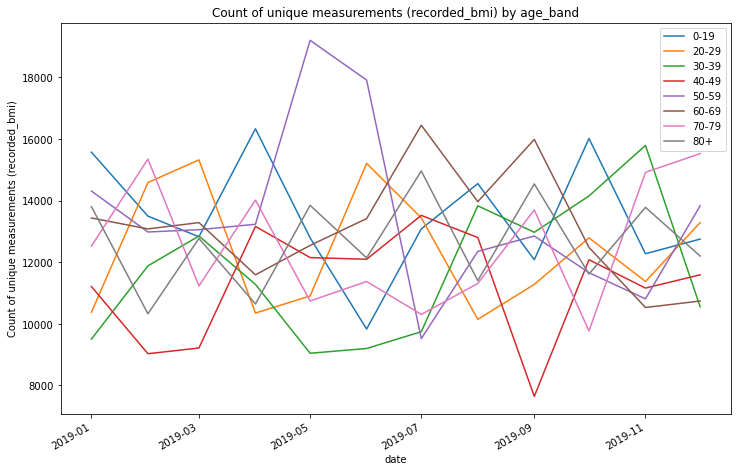

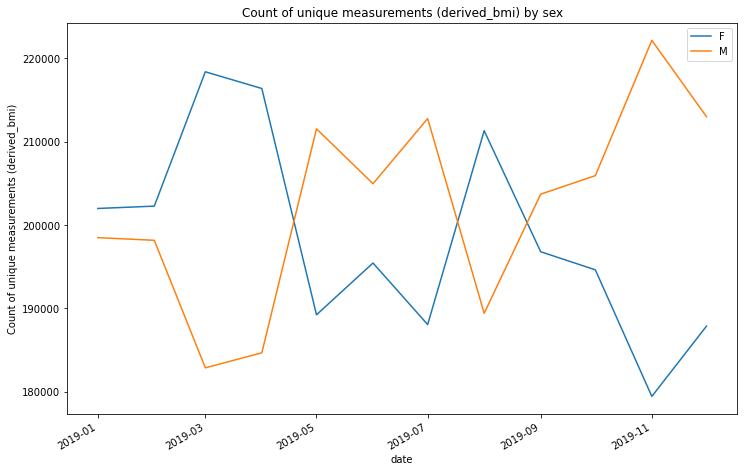

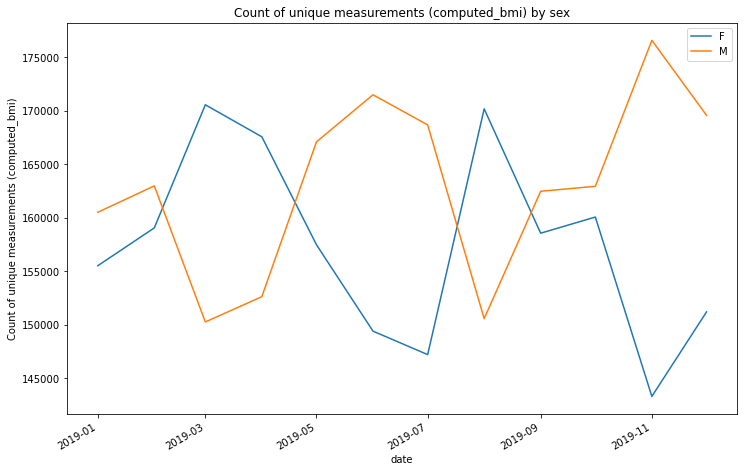

...

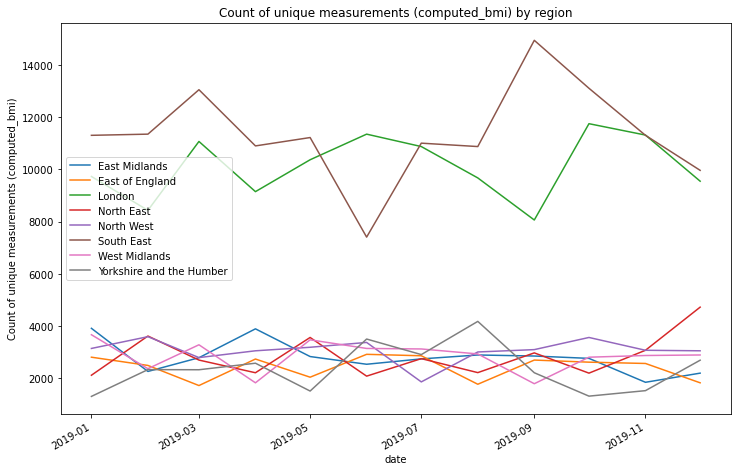

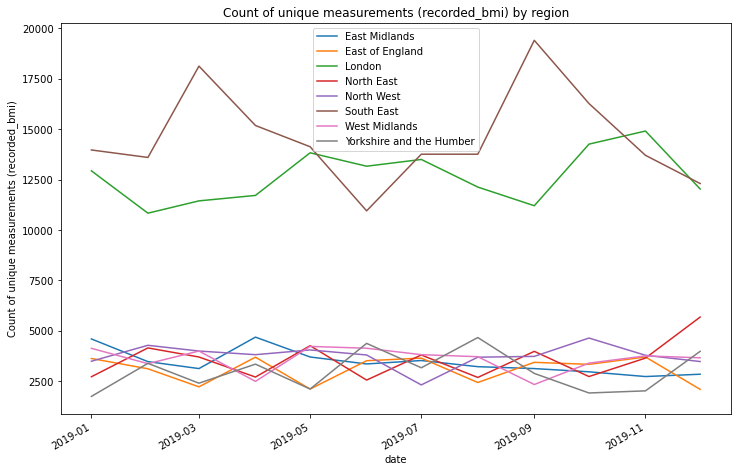

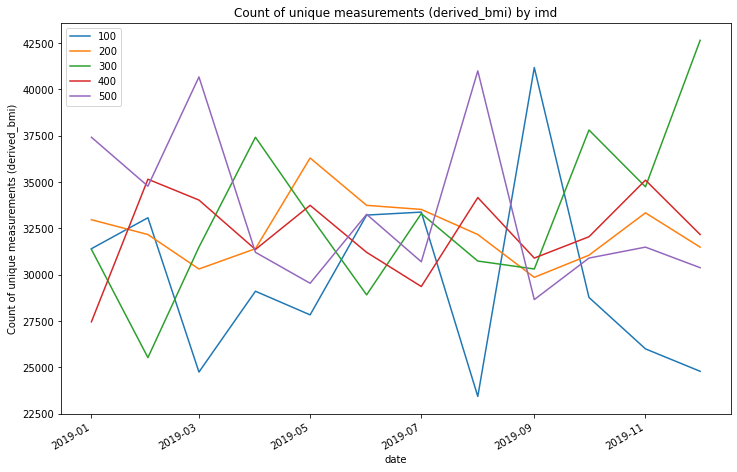

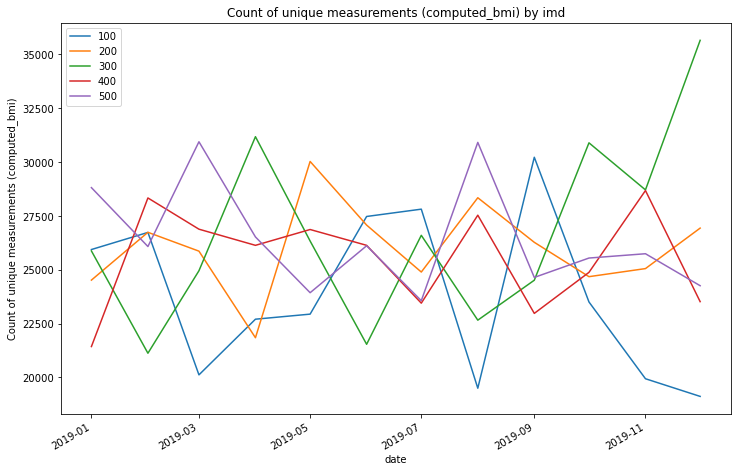

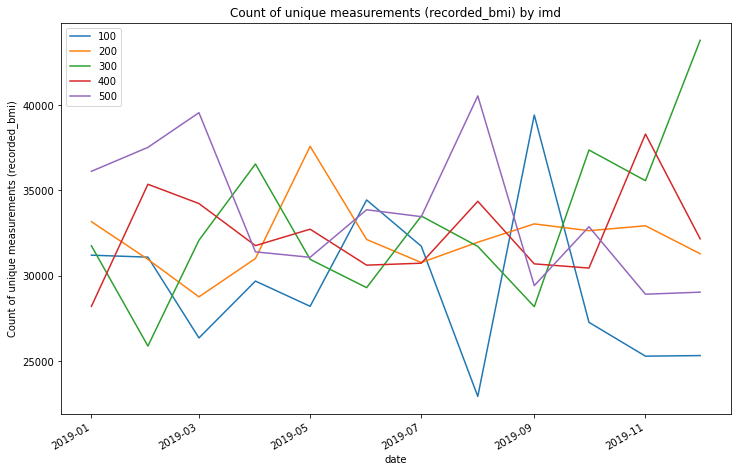

In [14]:
for group in demographic_covariates:
    report_over_time(df_occ, definitions, 'measurement', group)

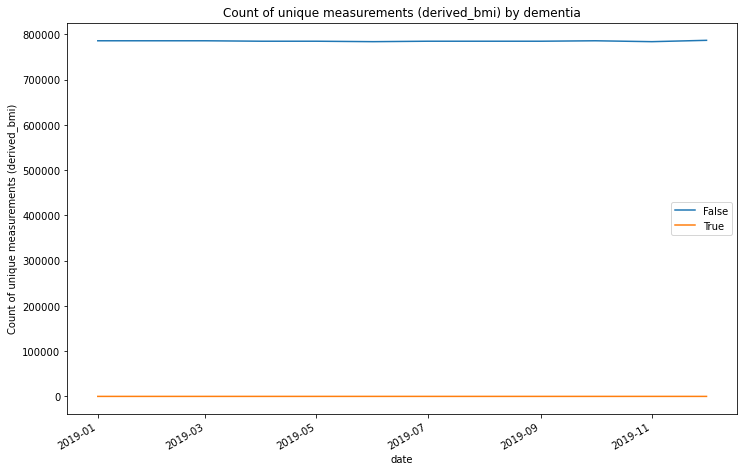

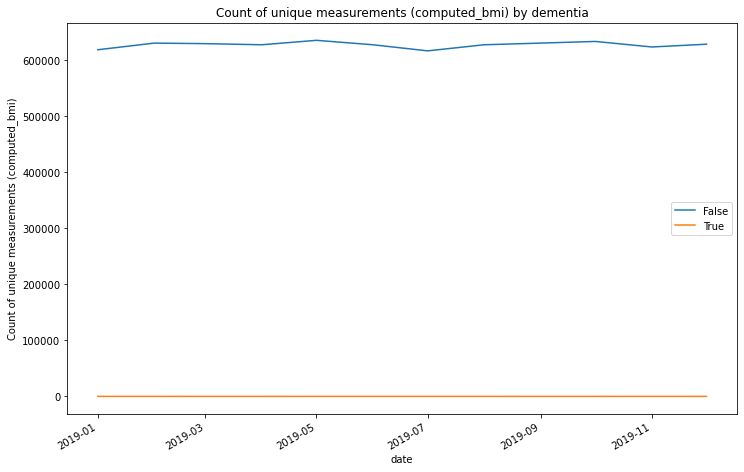

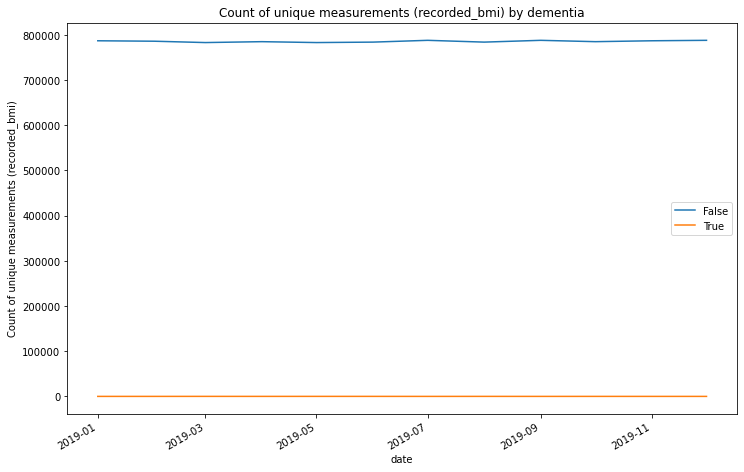

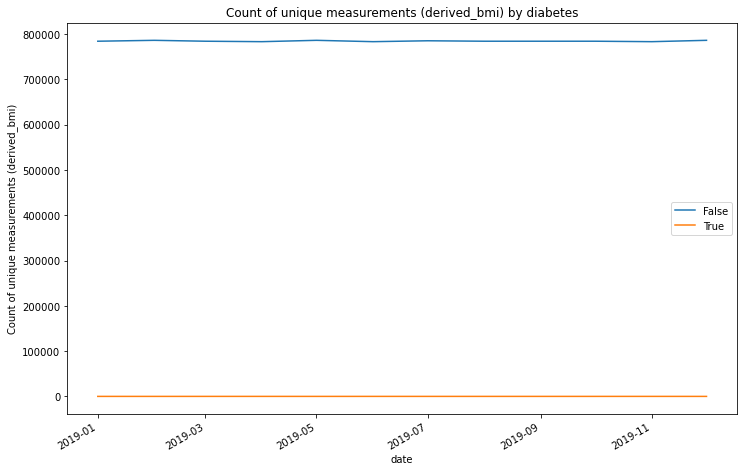

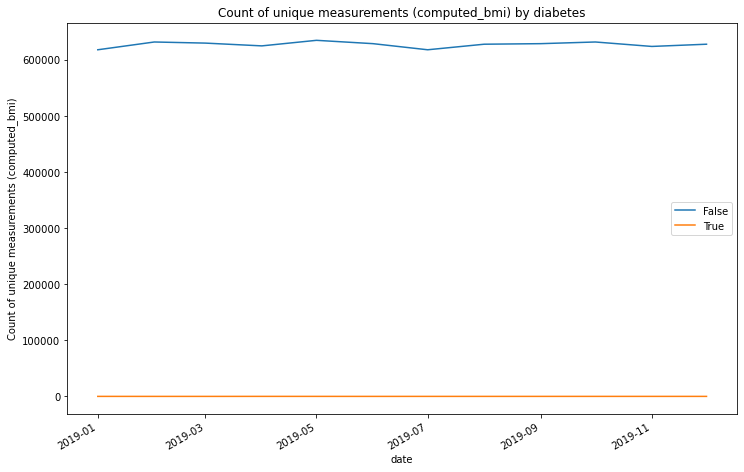

...

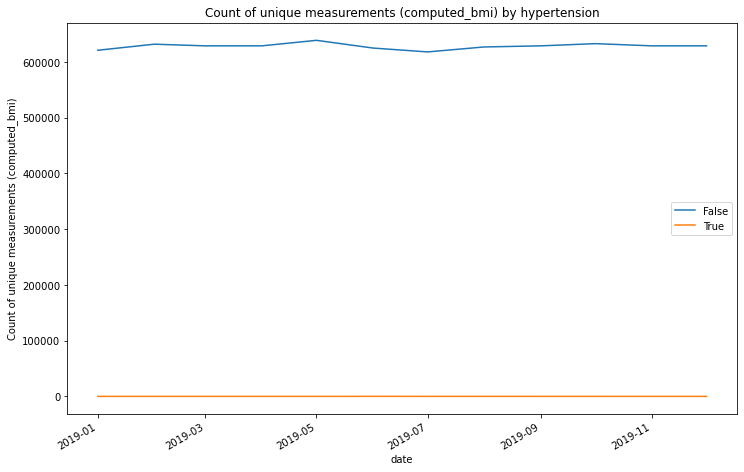

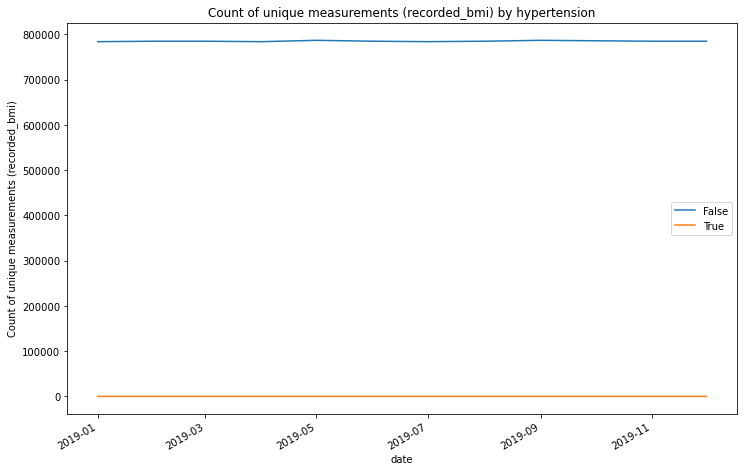

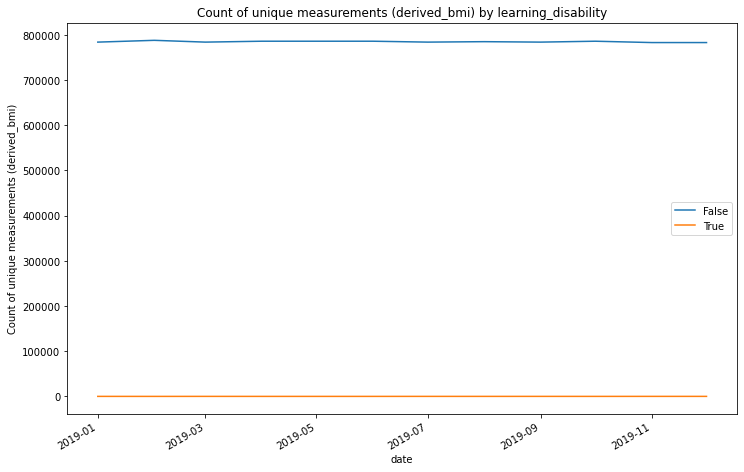

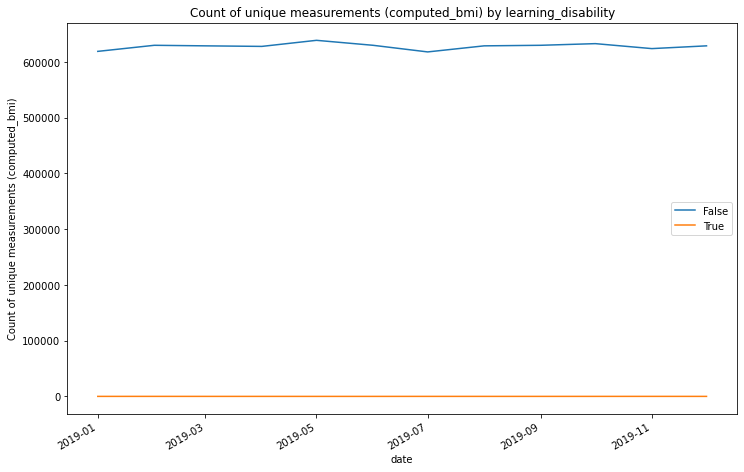

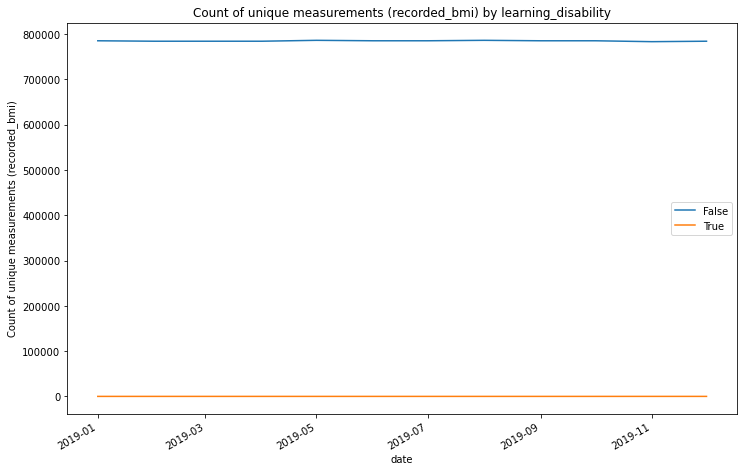

In [15]:
for group in clinical_covariates:
    report_over_time(df_occ, definitions, 'measurement', group)

#### Frequency of Update

Average update frequency by M:



,avg_diff,count
date_diff_derived_bmi,3.678274,4795
date_diff_computed_bmi,3.678274,4795
date_diff_recorded_bmi,3.678274,4795


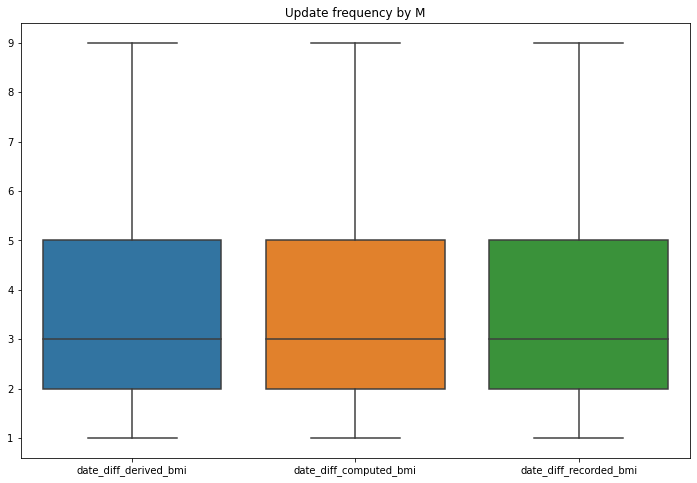

In [16]:
report_update_frequency(df_occ, definitions, time_delta, num_definitions)

Average update frequencies by M:



,avg_date_diff_derived_bmi,avg_date_diff_computed_bmi,avg_date_diff_recorded_bmi,ct_date_diff_derived_bmi,ct_date_diff_computed_bmi,ct_date_diff_recorded_bmi
age_band,,,,,,
0-19,3.660163,3.660163,3.660163,615,615,615
20-29,3.754501,3.754501,3.754501,610,610,610
30-39,3.712397,3.712397,3.712397,605,605,605
40-49,3.770093,3.770093,3.770093,535,535,535
50-59,3.54876,3.54876,3.54876,605,605,605
60-69,3.538705,3.538705,3.538705,635,635,635
70-79,3.631399,3.631399,3.631399,585,585,585
80+,3.825083,3.825083,3.825083,605,605,605


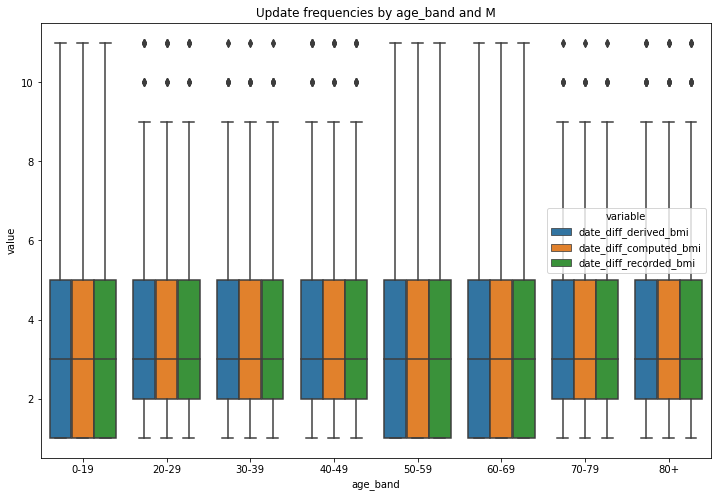

Average update frequencies by M:



,avg_date_diff_derived_bmi,avg_date_diff_computed_bmi,avg_date_diff_recorded_bmi,ct_date_diff_derived_bmi,ct_date_diff_computed_bmi,ct_date_diff_recorded_bmi
sex,,,,,,
F,3.678253,3.678253,3.678253,2360,2360,2360
M,3.678293,3.678293,3.678293,2435,2435,2435


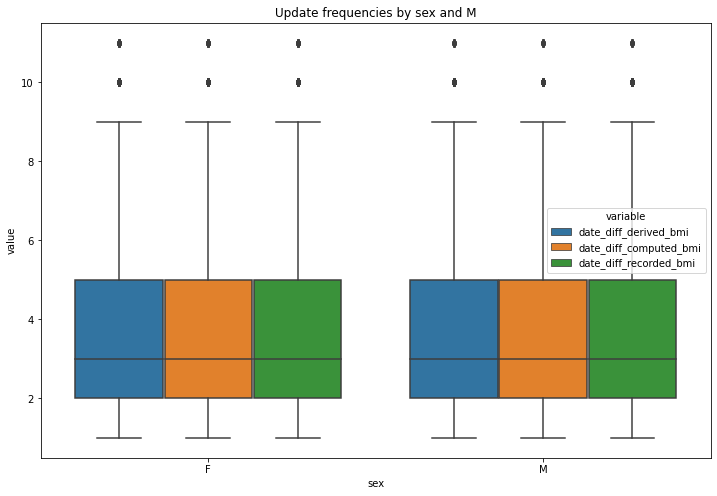

Average update frequencies by M:



,avg_date_diff_derived_bmi,avg_date_diff_computed_bmi,avg_date_diff_recorded_bmi,ct_date_diff_derived_bmi,ct_date_diff_computed_bmi,ct_date_diff_recorded_bmi
ethnicity,,,,,,
1,3.626923,3.626923,3.626923,260.0,260.0,260.0
2,3.644628,3.644628,3.644628,120.0,120.0,120.0
3,3.645161,3.645161,3.645161,60.0,60.0,60.0
4,3.257143,3.257143,3.257143,35.0,35.0,35.0
5,2.454545,2.454545,2.454545,35.0,35.0,35.0
6,3.555556,3.555556,3.555556,10.0,10.0,10.0
7,-,-,-,-,-,-
8,-,-,-,-,-,-


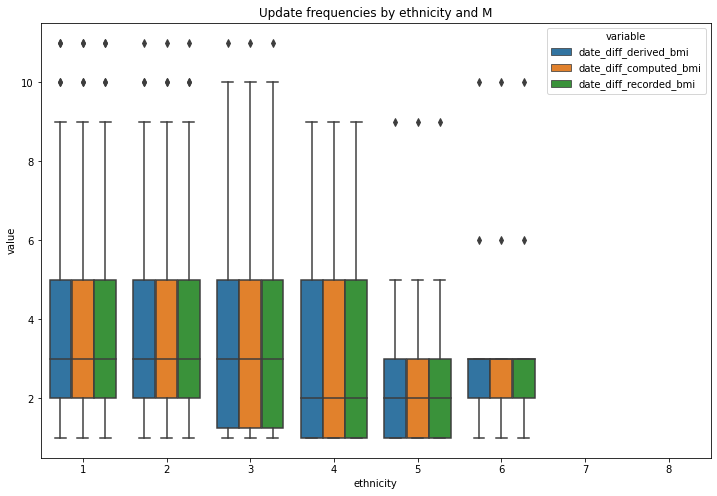

Average update frequencies by M:



,avg_date_diff_derived_bmi,avg_date_diff_computed_bmi,avg_date_diff_recorded_bmi,ct_date_diff_derived_bmi,ct_date_diff_computed_bmi,ct_date_diff_recorded_bmi
region,,,,,,
East Midlands,3.652027,3.652027,3.652027,295,295,295
East of England,3.637874,3.637874,3.637874,300,300,300
London,3.680992,3.680992,3.680992,605,605,605
North East,3.629393,3.629393,3.629393,315,315,315
North West,3.670588,3.670588,3.670588,340,340,340
South East,3.674312,3.674312,3.674312,655,655,655
West Midlands,3.73913,3.73913,3.73913,300,300,300
Yorkshire and the Humber,3.596215,3.596215,3.596215,315,315,315


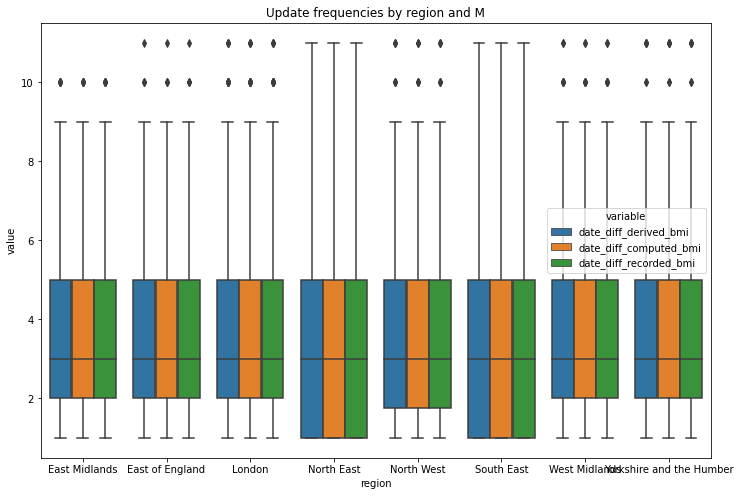

Average update frequencies by M:



,avg_date_diff_derived_bmi,avg_date_diff_computed_bmi,avg_date_diff_recorded_bmi,ct_date_diff_derived_bmi,ct_date_diff_computed_bmi,ct_date_diff_recorded_bmi
imd,,,,,,
100,3.648109,3.648109,3.648109,950,950,950
200,3.599581,3.599581,3.599581,955,955,955
300,3.803681,3.803681,3.803681,980,980,980
400,3.633643,3.633643,3.633643,970,970,970
500,3.704136,3.704136,3.704136,945,945,945


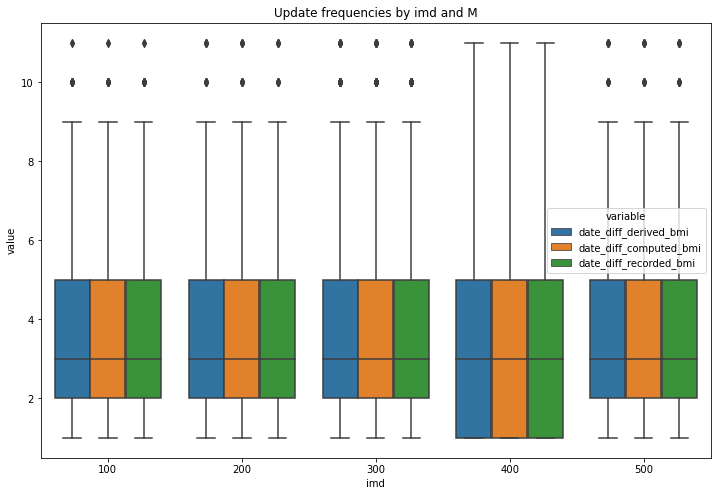

In [17]:
for group in demographic_covariates:
    report_update_frequency(df_occ, definitions, time_delta, num_definitions, group)

Average update frequencies by M:



,avg_date_diff_derived_bmi,avg_date_diff_computed_bmi,avg_date_diff_recorded_bmi,ct_date_diff_derived_bmi,ct_date_diff_computed_bmi,ct_date_diff_recorded_bmi
dementia,,,,,,
False,3.677955,3.677955,3.677955,4755,4755,4755
True,3.714286,3.714286,3.714286,40,40,40


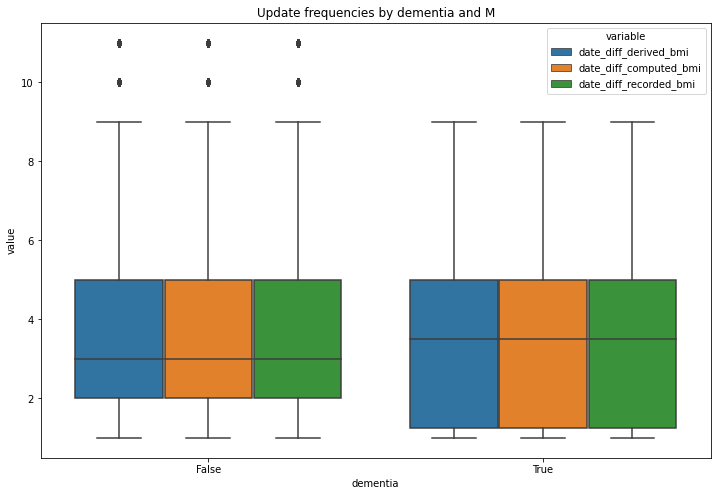

Average update frequencies by M:



,avg_date_diff_derived_bmi,avg_date_diff_computed_bmi,avg_date_diff_recorded_bmi,ct_date_diff_derived_bmi,ct_date_diff_computed_bmi,ct_date_diff_recorded_bmi
diabetes,,,,,,
False,3.682824,3.682824,3.682824,4745,4745,4745
True,3.254902,3.254902,3.254902,50,50,50


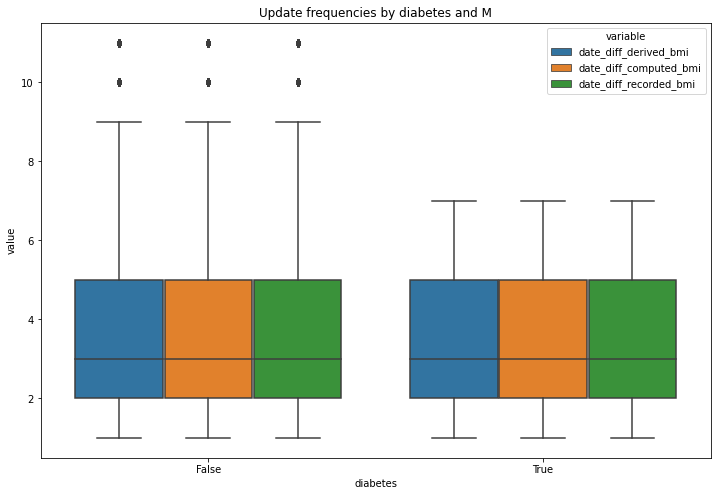

Average update frequencies by M:



,avg_date_diff_derived_bmi,avg_date_diff_computed_bmi,avg_date_diff_recorded_bmi,ct_date_diff_derived_bmi,ct_date_diff_computed_bmi,ct_date_diff_recorded_bmi
hypertension,,,,,,
False,3.679916,3.679916,3.679916,4755,4755,4755
True,3.487805,3.487805,3.487805,40,40,40


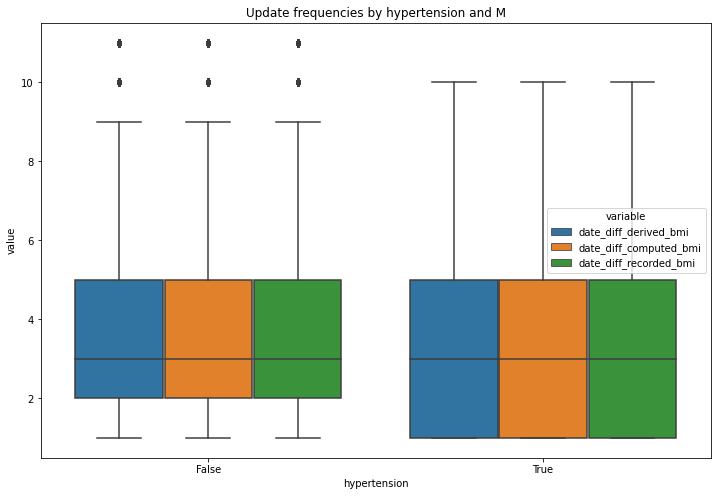

Average update frequencies by M:



,avg_date_diff_derived_bmi,avg_date_diff_computed_bmi,avg_date_diff_recorded_bmi,ct_date_diff_derived_bmi,ct_date_diff_computed_bmi,ct_date_diff_recorded_bmi
learning_disability,,,,,,
False,3.679301,3.679301,3.679301,4750,4750,4750
True,3.574468,3.574468,3.574468,45,45,45


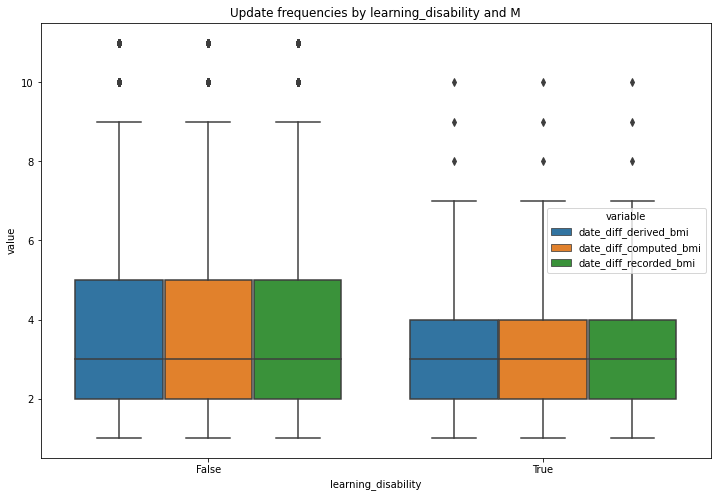

In [18]:
for group in clinical_covariates:
    report_update_frequency(df_occ, definitions, time_delta, num_definitions, group)

### Value

#### Values Out of Range

,oor_derived_bmi,oor_computed_bmi,oor_recorded_bmi
count,10.000000,-,-
mean,1.480424,-,-
pct25,0.683759,-,-
pct75,3.029533,-,-


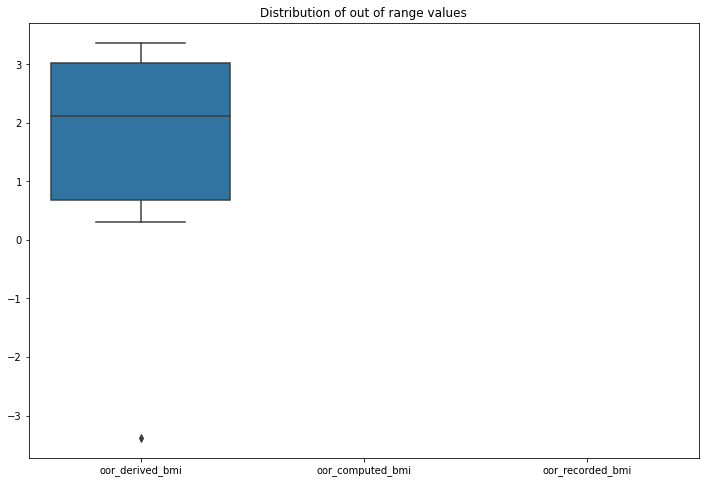

In [19]:
report_out_of_range(df_occ, definitions, min_range, max_range, num_definitions, null)

In [20]:
for group in demographic_covariates:
    report_out_of_range(df_occ, definitions, min_range, max_range, num_definitions, null, group)

,count_derived_bmi,mean_derived_bmi,pct25_derived_bmi,pct75_derived_bmi,count_computed_bmi,mean_computed_bmi,pct25_computed_bmi,pct75_computed_bmi,count_recorded_bmi,mean_recorded_bmi,pct25_recorded_bmi,pct75_recorded_bmi
age_band,,,,,,,,,,,,
0-19,-,-,-,-,-,-,-,-,-,-,-,-
20-29,-,-,-,-,-,-,-,-,-,-,-,-
30-39,-,-,-,-,-,-,-,-,-,-,-,-
40-49,-,-,-,-,-,-,-,-,-,-,-,-
50-59,-,-,-,-,-,-,-,-,-,-,-,-
60-69,-,-,-,-,-,-,-,-,-,-,-,-
70-79,-,-,-,-,-,-,-,-,-,-,-,-
80+,-,-,-,-,-,-,-,-,-,-,-,-


Plot redacted due to low counts.


,count_derived_bmi,mean_derived_bmi,pct25_derived_bmi,pct75_derived_bmi,count_computed_bmi,mean_computed_bmi,pct25_computed_bmi,pct75_computed_bmi,count_recorded_bmi,mean_recorded_bmi,pct25_recorded_bmi,pct75_recorded_bmi
sex,,,,,,,,,,,,
F,-,-,-,-,-,-,-,-,-,-,-,-
M,-,-,-,-,-,-,-,-,-,-,-,-


Plot redacted due to low counts.


,count_derived_bmi,mean_derived_bmi,pct25_derived_bmi,pct75_derived_bmi,count_computed_bmi,mean_computed_bmi,pct25_computed_bmi,pct75_computed_bmi,count_recorded_bmi,mean_recorded_bmi,pct25_recorded_bmi,pct75_recorded_bmi
ethnicity,,,,,,,,,,,,
1,-,-,-,-,-,-,-,-,-,-,-,-
2,-,-,-,-,-,-,-,-,-,-,-,-
3,-,-,-,-,-,-,-,-,-,-,-,-
4,-,-,-,-,-,-,-,-,-,-,-,-
5,-,-,-,-,-,-,-,-,-,-,-,-
6,-,-,-,-,-,-,-,-,-,-,-,-
7,-,-,-,-,-,-,-,-,-,-,-,-
8,-,-,-,-,-,-,-,-,-,-,-,-


Plot redacted due to low counts.


,count_derived_bmi,mean_derived_bmi,pct25_derived_bmi,pct75_derived_bmi,count_computed_bmi,mean_computed_bmi,pct25_computed_bmi,pct75_computed_bmi,count_recorded_bmi,mean_recorded_bmi,pct25_recorded_bmi,pct75_recorded_bmi
region,,,,,,,,,,,,
East Midlands,-,-,-,-,-,-,-,-,-,-,-,-
East of England,-,-,-,-,-,-,-,-,-,-,-,-
London,-,-,-,-,-,-,-,-,-,-,-,-
North East,-,-,-,-,-,-,-,-,-,-,-,-
North West,-,-,-,-,-,-,-,-,-,-,-,-
South East,-,-,-,-,-,-,-,-,-,-,-,-
West Midlands,-,-,-,-,-,-,-,-,-,-,-,-
Yorkshire and the Humber,-,-,-,-,-,-,-,-,-,-,-,-


Plot redacted due to low counts.


,count_derived_bmi,mean_derived_bmi,pct25_derived_bmi,pct75_derived_bmi,count_computed_bmi,mean_computed_bmi,pct25_computed_bmi,pct75_computed_bmi,count_recorded_bmi,mean_recorded_bmi,pct25_recorded_bmi,pct75_recorded_bmi
imd,,,,,,,,,,,,
100,-,-,-,-,-,-,-,-,-,-,-,-
200,-,-,-,-,-,-,-,-,-,-,-,-
300,-,-,-,-,-,-,-,-,-,-,-,-
400,-,-,-,-,-,-,-,-,-,-,-,-
500,-,-,-,-,-,-,-,-,-,-,-,-


Plot redacted due to low counts.


,count_derived_bmi,mean_derived_bmi,pct25_derived_bmi,pct75_derived_bmi,count_computed_bmi,mean_computed_bmi,pct25_computed_bmi,pct75_computed_bmi,count_recorded_bmi,mean_recorded_bmi,pct25_recorded_bmi,pct75_recorded_bmi
dementia,,,,,,,,,,,,
False,10.0,1.480424,0.683759,3.029533,-,-,-,-,-,-,-,-
True,-,-,-,-,-,-,-,-,-,-,-,-


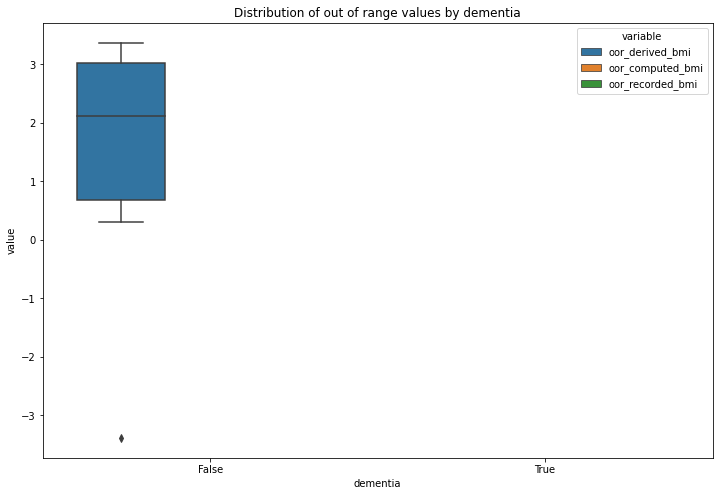

,count_derived_bmi,mean_derived_bmi,pct25_derived_bmi,pct75_derived_bmi,count_computed_bmi,mean_computed_bmi,pct25_computed_bmi,pct75_computed_bmi,count_recorded_bmi,mean_recorded_bmi,pct25_recorded_bmi,pct75_recorded_bmi
diabetes,,,,,,,,,,,,
False,10.0,1.480424,0.683759,3.029533,-,-,-,-,-,-,-,-
True,-,-,-,-,-,-,-,-,-,-,-,-


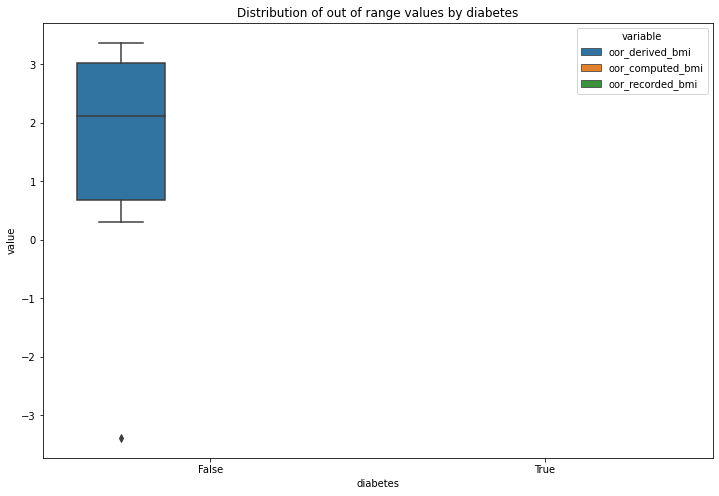

,count_derived_bmi,mean_derived_bmi,pct25_derived_bmi,pct75_derived_bmi,count_computed_bmi,mean_computed_bmi,pct25_computed_bmi,pct75_computed_bmi,count_recorded_bmi,mean_recorded_bmi,pct25_recorded_bmi,pct75_recorded_bmi
hypertension,,,,,,,,,,,,
False,10.0,1.480424,0.683759,3.029533,-,-,-,-,-,-,-,-
True,-,-,-,-,-,-,-,-,-,-,-,-


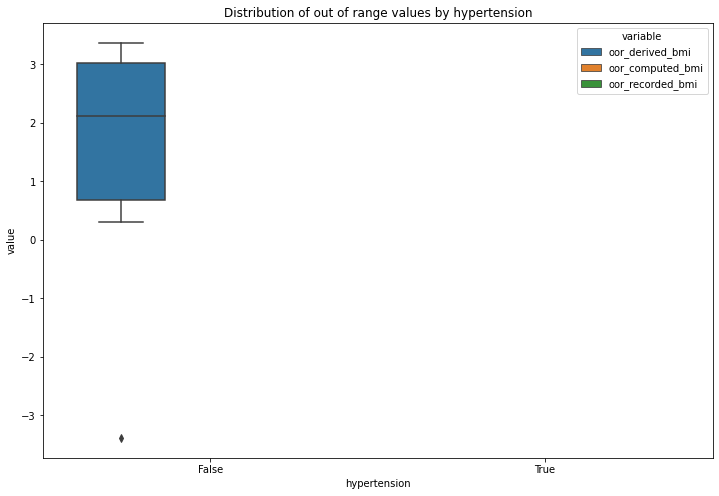

,count_derived_bmi,mean_derived_bmi,pct25_derived_bmi,pct75_derived_bmi,count_computed_bmi,mean_computed_bmi,pct25_computed_bmi,pct75_computed_bmi,count_recorded_bmi,mean_recorded_bmi,pct25_recorded_bmi,pct75_recorded_bmi
learning_disability,,,,,,,,,,,,
False,10.0,1.480424,0.683759,3.029533,-,-,-,-,-,-,-,-
True,-,-,-,-,-,-,-,-,-,-,-,-


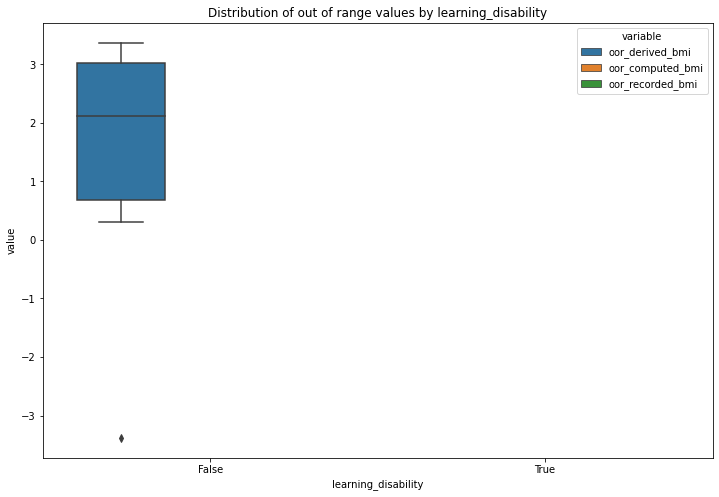

In [21]:
for group in clinical_covariates:
    report_out_of_range(df_occ, definitions, min_range, max_range, num_definitions, null, group)

#### Distributions

Averages:



,mean,count
derived_bmi,27.964671,9610
computed_bmi,25.783178,7685
recorded_bmi,21.984294,9610


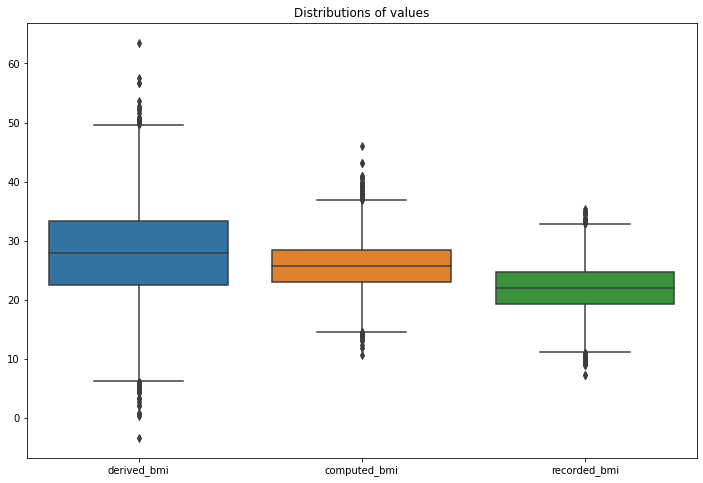

In [22]:
report_distribution(df_occ, definitions, num_definitions)

Averages by age_band:



,avg_derived_bmi,avg_computed_bmi,avg_recorded_bmi,ct_derived_bmi,ct_computed_bmi,ct_recorded_bmi
age_band,,,,,,
0-19,28.011055,25.711077,21.931199,1220,955,1245
20-29,28.148984,25.773702,22.089352,1210,950,1190
30-39,27.730272,25.633569,22.0322,1155,925,1155
40-49,27.837769,25.906787,22.142553,1130,930,1135
50-59,27.808163,25.808069,22.117417,1260,1035,1235
60-69,28.286173,26.00697,21.870578,1280,1030,1215
70-79,27.907152,25.688707,21.940477,1180,910,1215
80+,27.955389,25.710825,21.767192,1180,950,1230


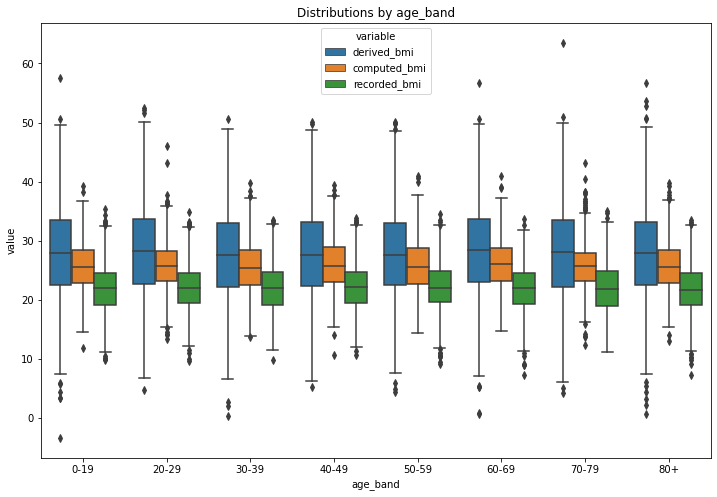

Averages by sex:



,avg_derived_bmi,avg_computed_bmi,avg_recorded_bmi,ct_derived_bmi,ct_computed_bmi,ct_recorded_bmi
sex,,,,,,
F,28.038996,25.807819,21.909177,4805,3815,4755
M,27.890377,25.758918,22.057834,4805,3875,4855


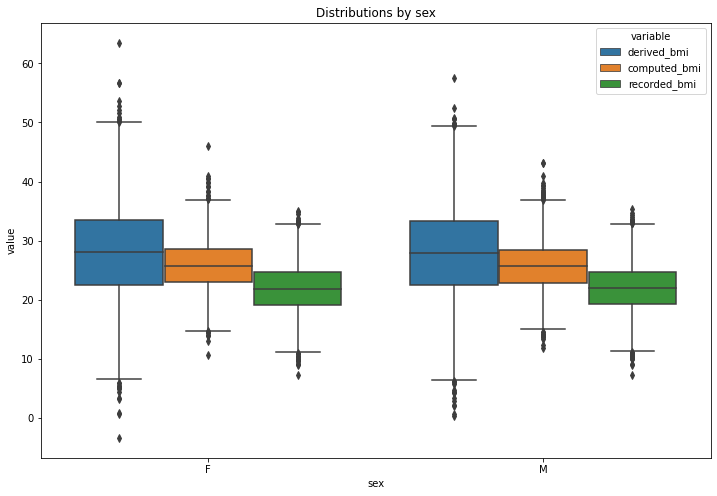

Averages by ethnicity:



,avg_derived_bmi,avg_computed_bmi,avg_recorded_bmi,ct_derived_bmi,ct_computed_bmi,ct_recorded_bmi
ethnicity,,,,,,
1,28.146736,25.900447,21.769518,510.0,405.0,510.0
2,28.813054,26.275592,21.912191,225.0,185.0,235.0
3,28.783243,25.799516,21.898914,115.0,95.0,120.0
4,26.861961,25.590608,21.464214,65.0,60.0,65.0
5,27.08036,25.409922,20.705991,45.0,40.0,55.0
6,28.50773,24.565458,22.32786,15.0,10.0,15.0
7,-,-,-,-,-,-
8,-,-,22.961431,-,-,10.0


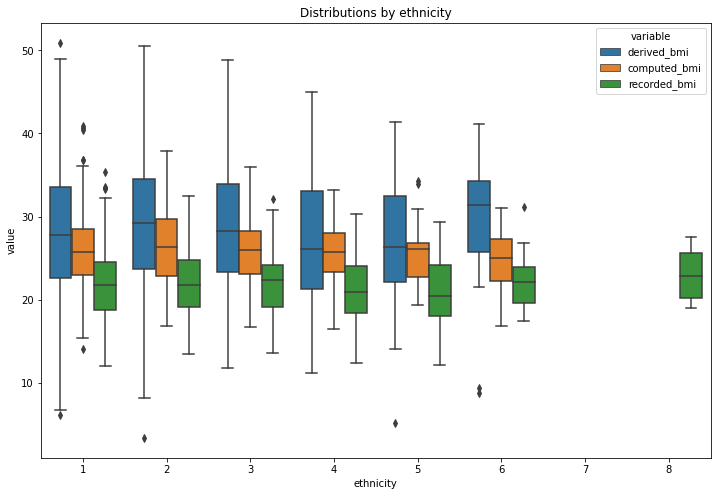

Averages by region:



,avg_derived_bmi,avg_computed_bmi,avg_recorded_bmi,ct_derived_bmi,ct_computed_bmi,ct_recorded_bmi
region,,,,,,
East Midlands,27.731969,25.851766,21.938781,635,510,630
East of England,27.11361,25.602719,21.79448,605,470,590
London,27.862313,25.690649,22.006363,1200,960,1205
North East,27.950496,25.763361,21.898896,615,505,625
North West,27.866822,25.857908,21.898967,650,535,650
South East,28.478273,25.676622,22.039836,1280,1010,1300
West Midlands,28.229619,25.873931,22.373506,655,510,640
Yorkshire and the Humber,28.007455,25.513112,22.131824,570,455,580


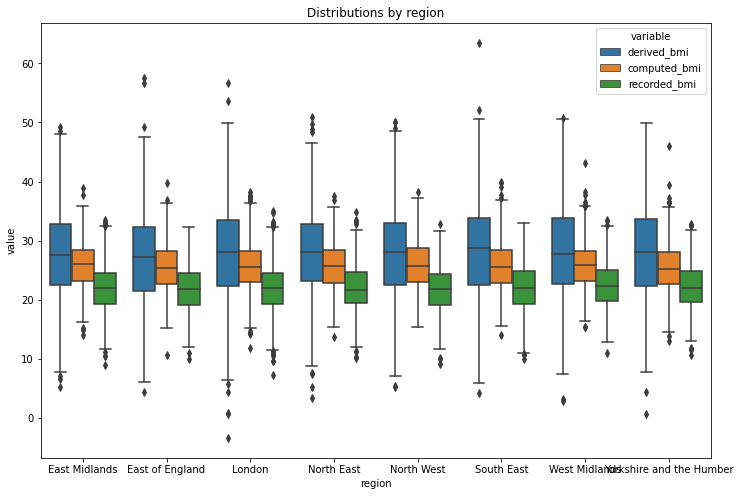

Averages by imd:



,avg_derived_bmi,avg_computed_bmi,avg_recorded_bmi,ct_derived_bmi,ct_computed_bmi,ct_recorded_bmi
imd,,,,,,
100,27.862201,25.773541,22.020803,1855,1485,1835
200,28.0517,25.769227,21.908616,1935,1555,1925
300,28.170072,25.813168,21.976391,1955,1570,1950
400,27.822867,25.815559,22.104527,1910,1515,1925
500,27.909156,25.7445,21.914867,1960,1555,1980


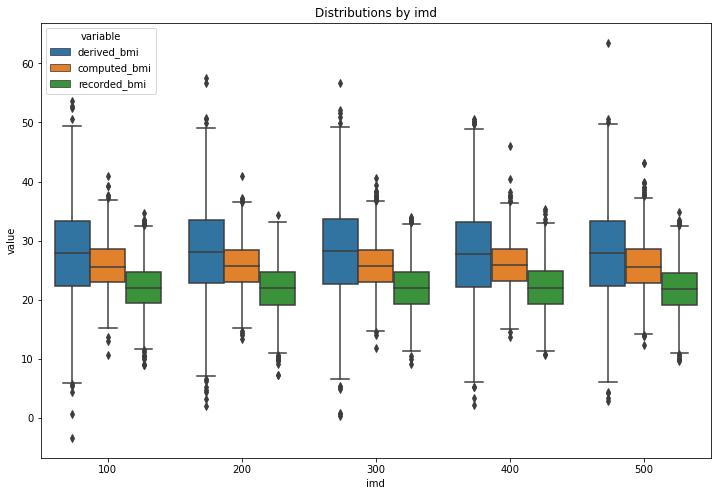

In [23]:
for group in demographic_covariates:
    report_distribution(df_occ, definitions, num_definitions, group)

Averages by dementia:



,avg_derived_bmi,avg_computed_bmi,avg_recorded_bmi,ct_derived_bmi,ct_computed_bmi,ct_recorded_bmi
dementia,,,,,,
False,27.954307,25.785399,21.980177,9520,7605,9525
True,29.037041,25.569259,22.429874,90,80,90


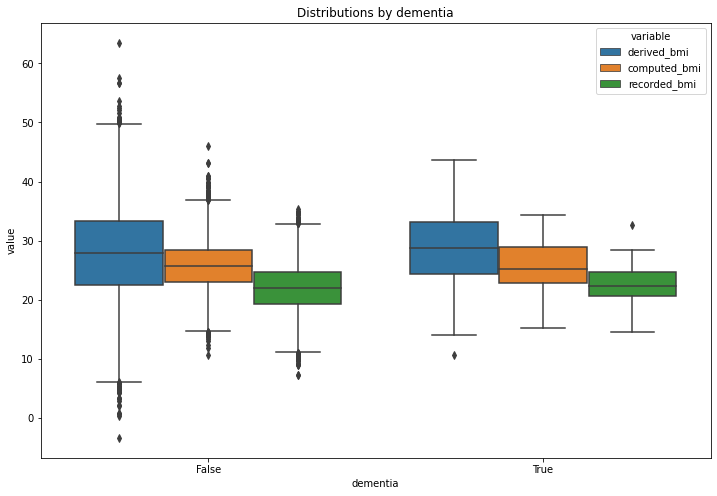

Averages by diabetes:



,avg_derived_bmi,avg_computed_bmi,avg_recorded_bmi,ct_derived_bmi,ct_computed_bmi,ct_recorded_bmi
diabetes,,,,,,
False,27.964973,25.786328,21.984190,9510,7600,9515
True,27.937066,25.504781,21.994665,105,85,95


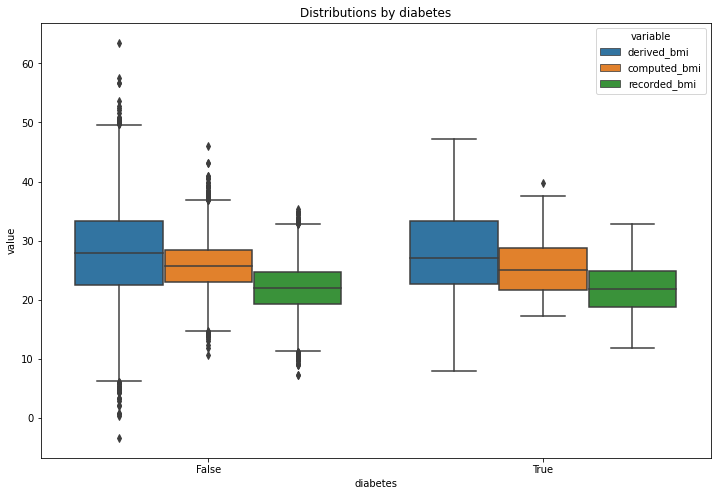

Averages by hypertension:



,avg_derived_bmi,avg_computed_bmi,avg_recorded_bmi,ct_derived_bmi,ct_computed_bmi,ct_recorded_bmi
hypertension,,,,,,
False,27.966860,25.785111,21.980950,9515,7610,9520
True,27.745372,25.584332,22.322941,95,75,95


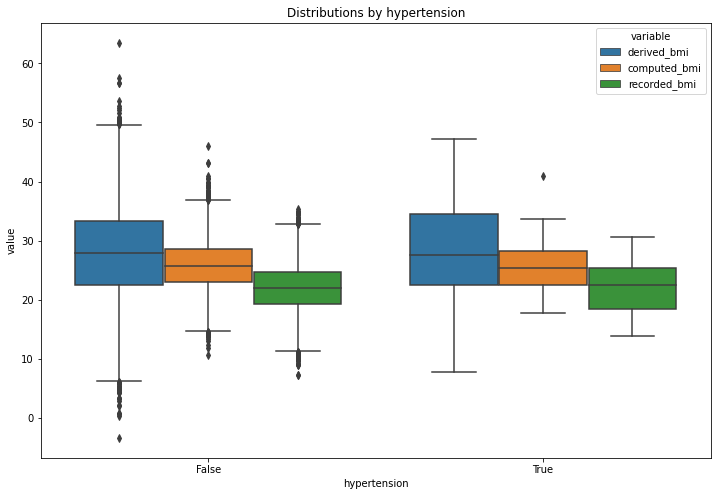

Averages by learning_disability:



,avg_derived_bmi,avg_computed_bmi,avg_recorded_bmi,ct_derived_bmi,ct_computed_bmi,ct_recorded_bmi
learning_disability,,,,,,
False,27.949890,25.783827,21.988058,9515,7610,9510
True,29.414583,25.718139,21.626311,95,75,100


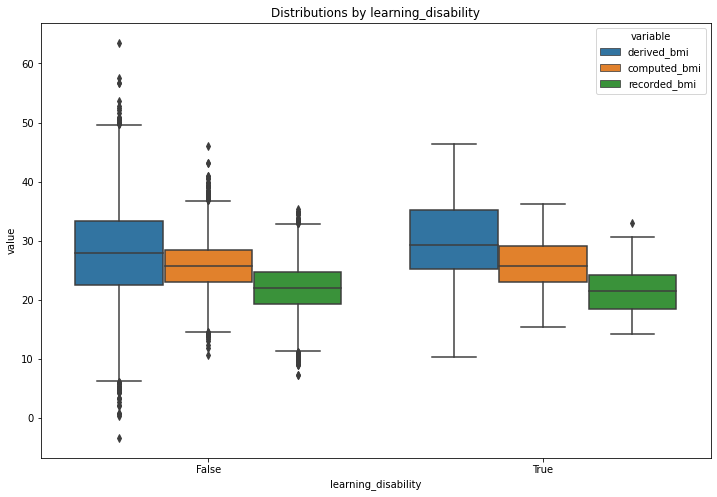

In [24]:
for group in clinical_covariates:
    report_distribution(df_occ, definitions, num_definitions, group)

#### Measures Over Time

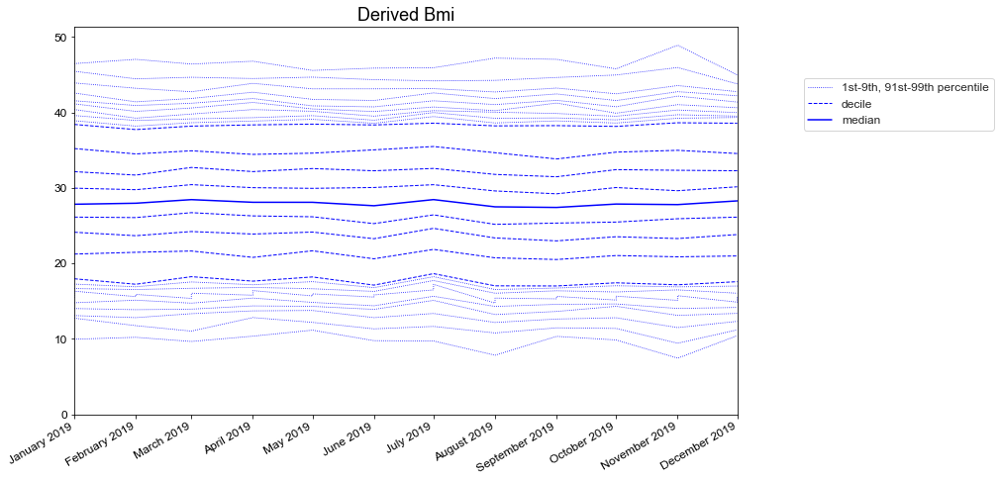

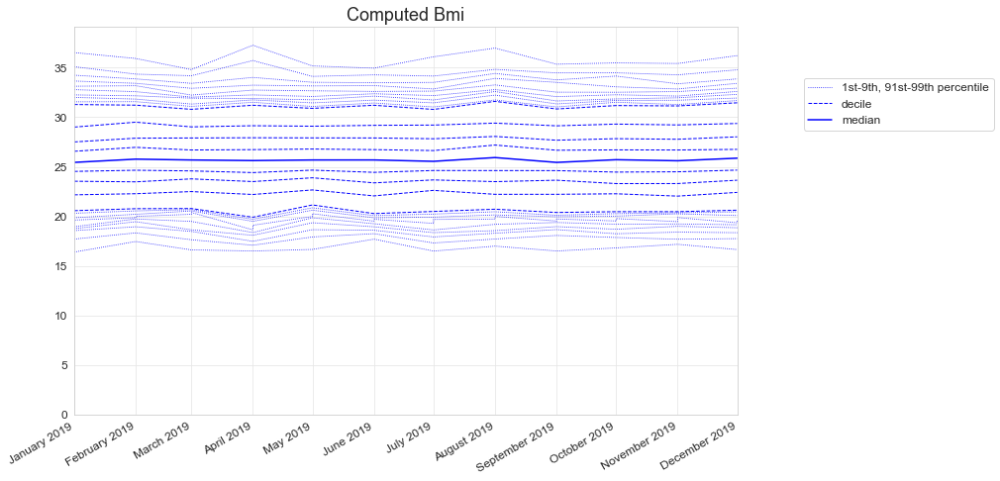

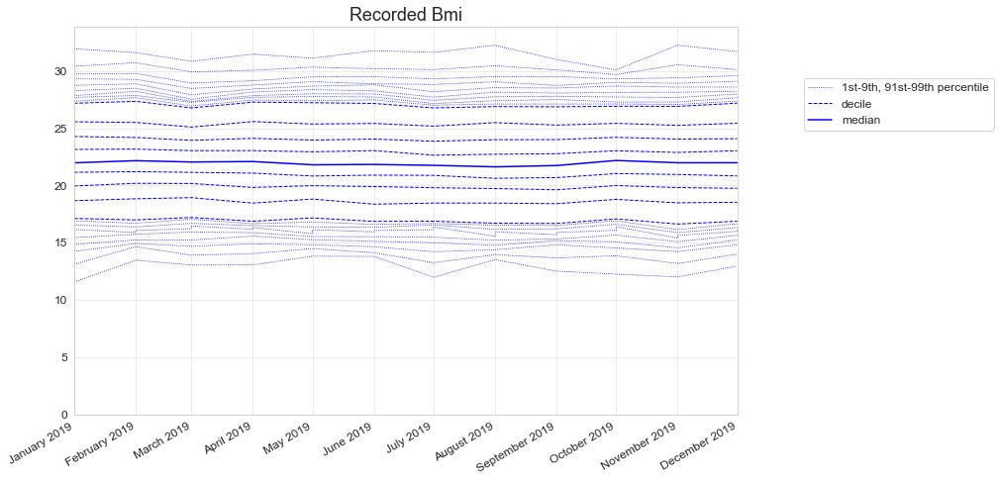

In [25]:
measure_over_time(df_occ, definitions)

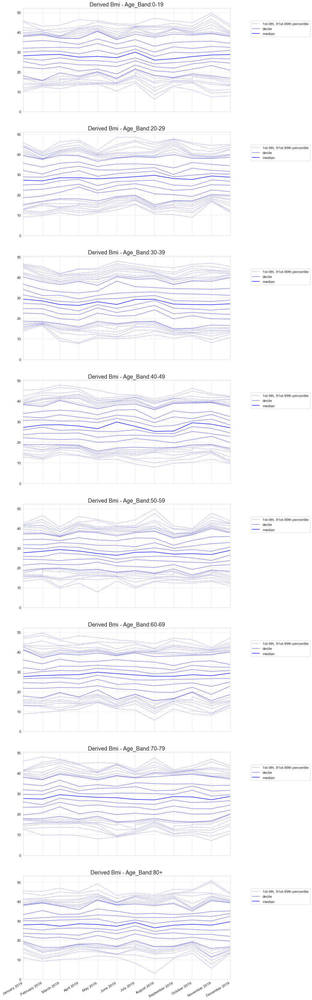

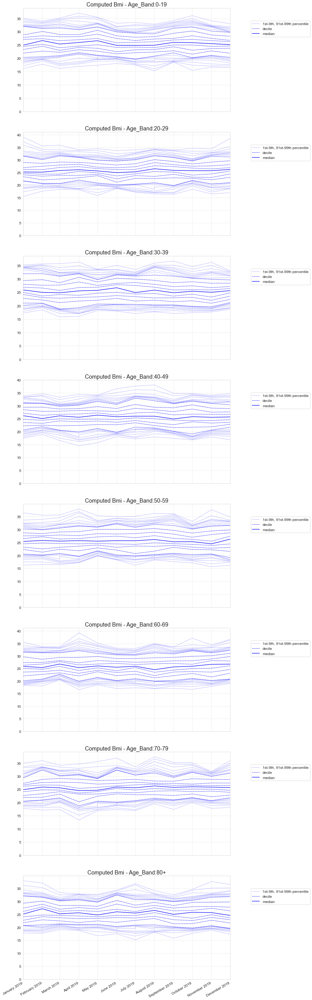

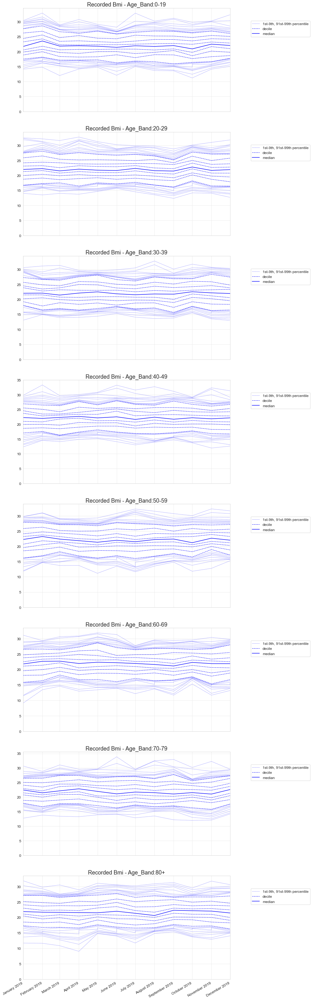

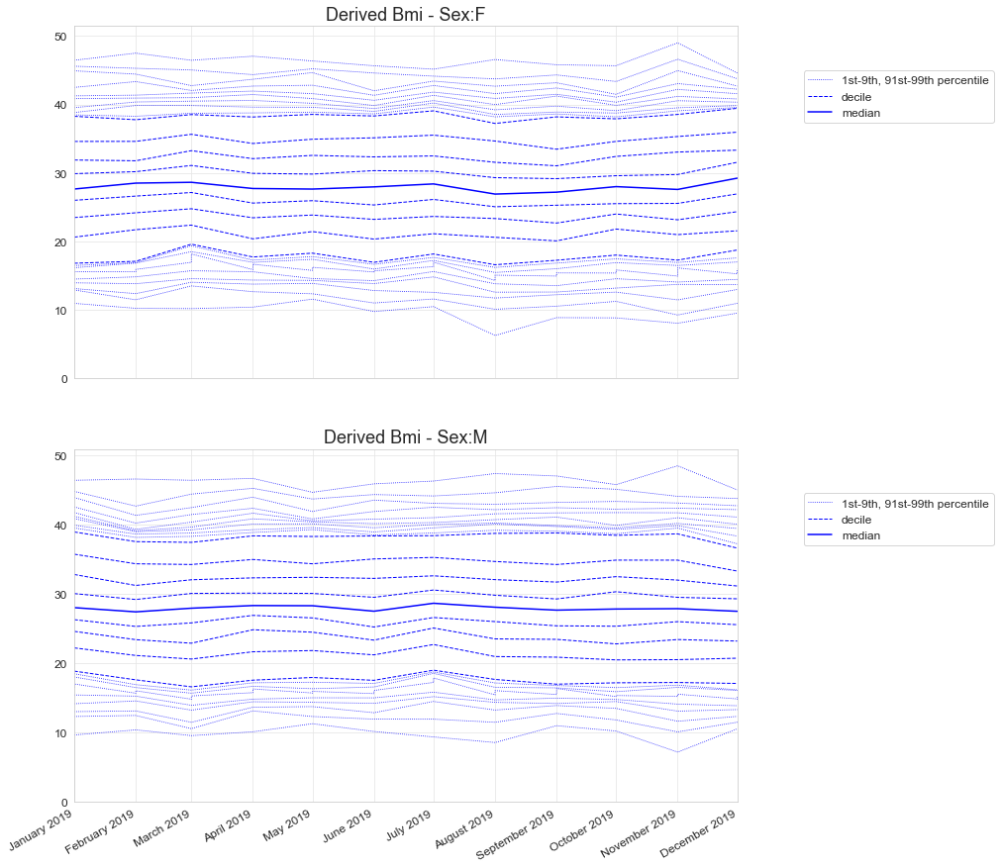

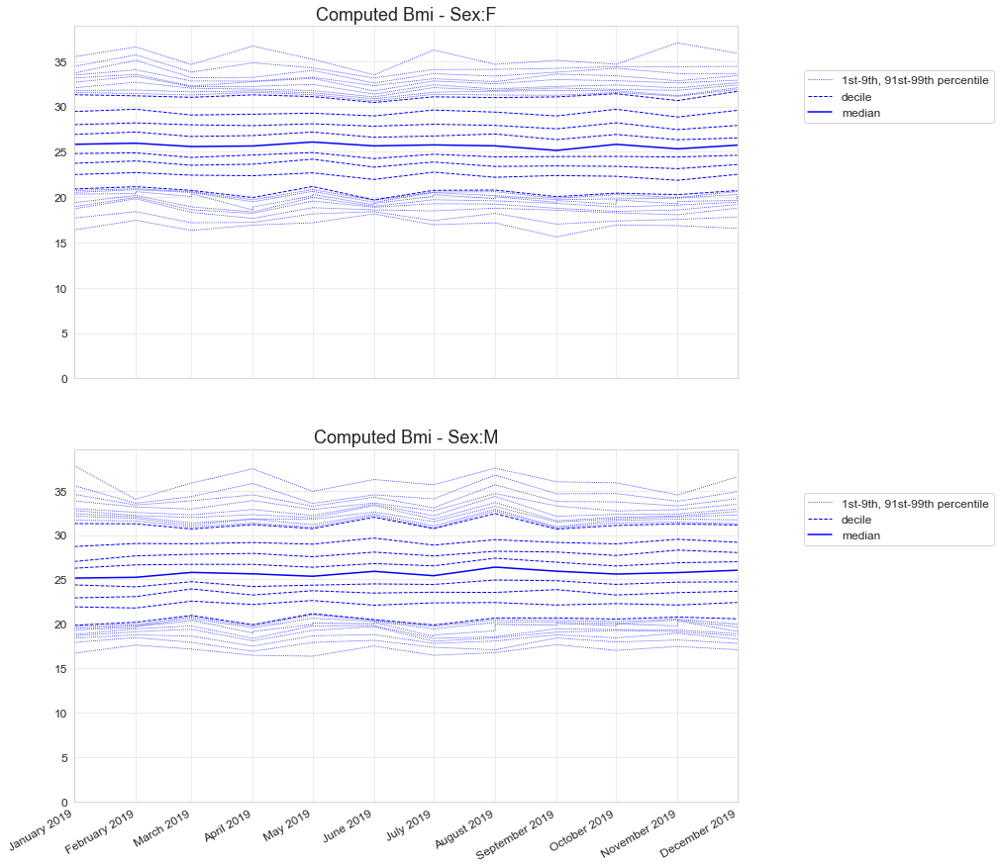

...

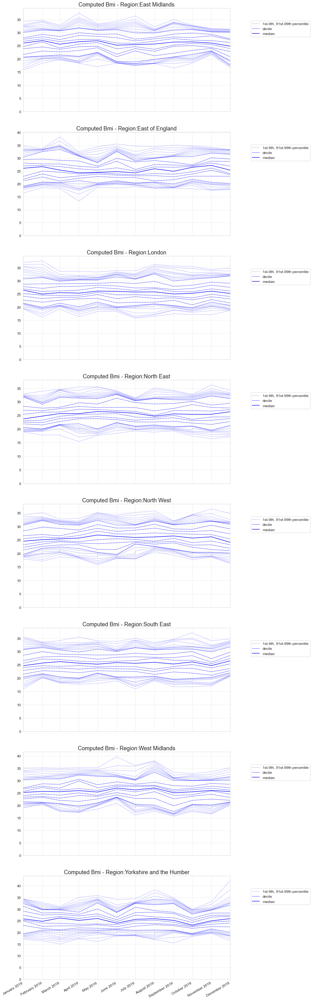

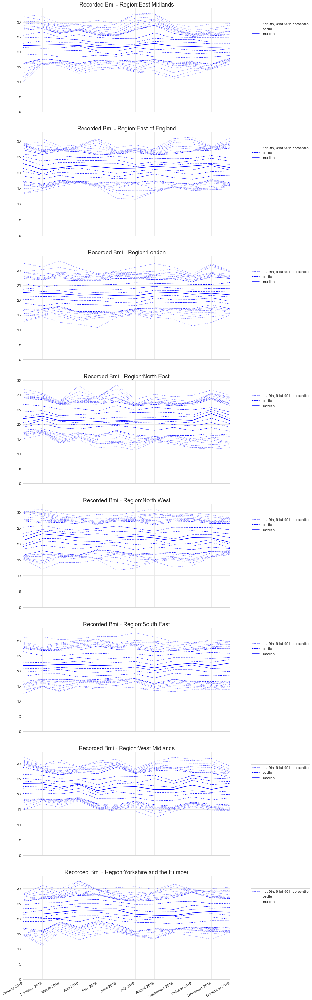

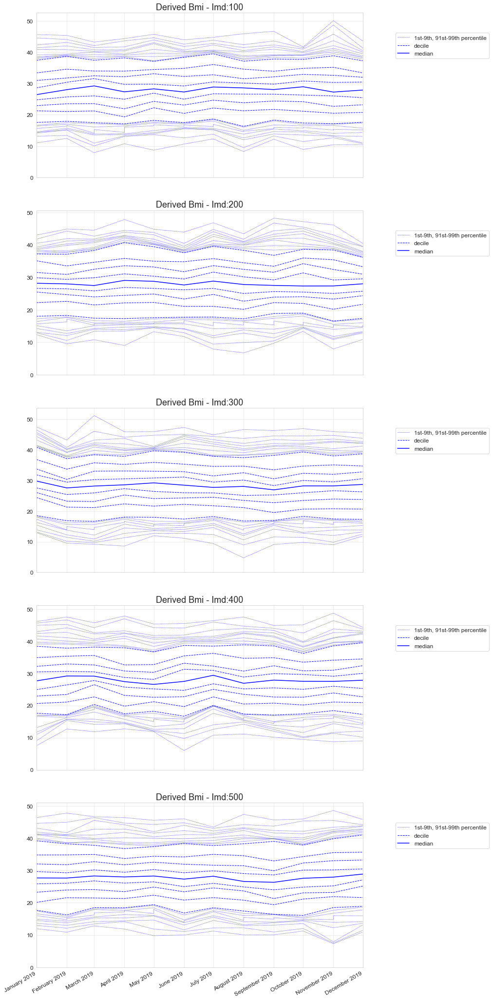

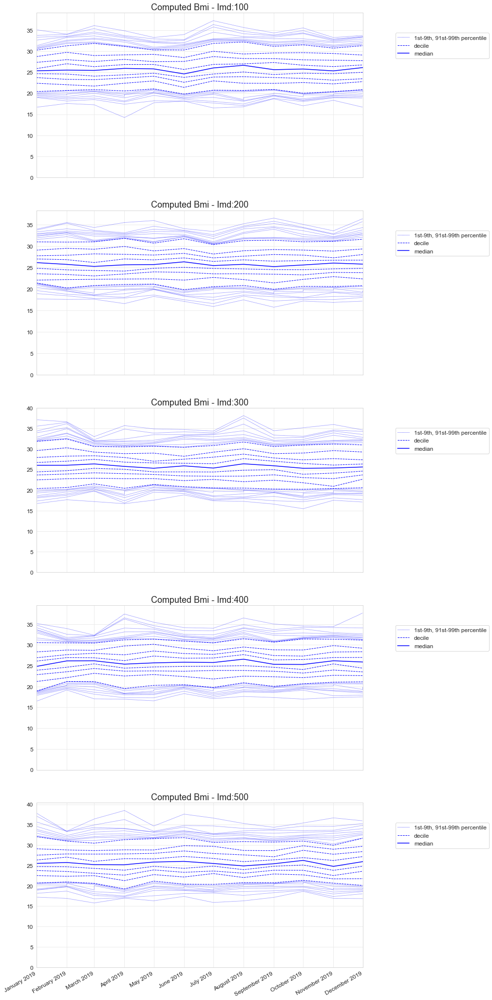

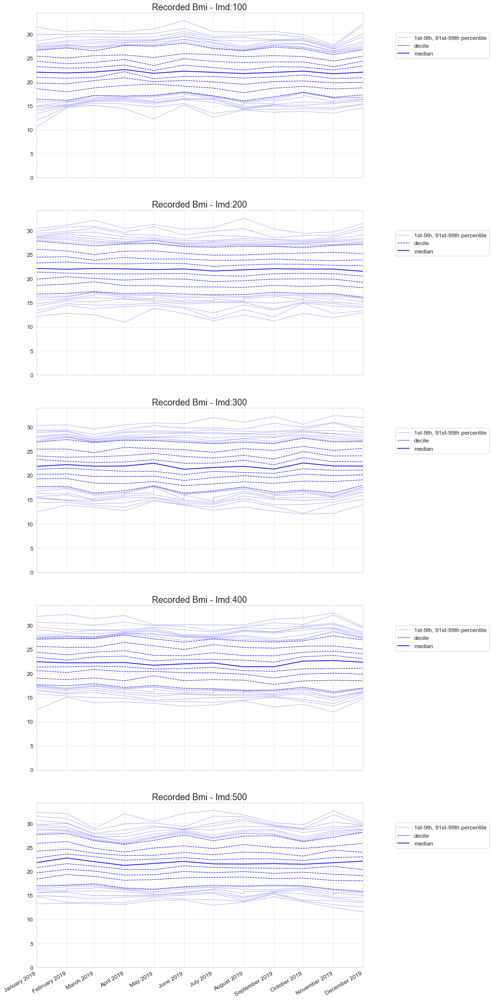

In [26]:
for group in demographic_covariates:
    measure_over_time(df_occ, definitions, group)

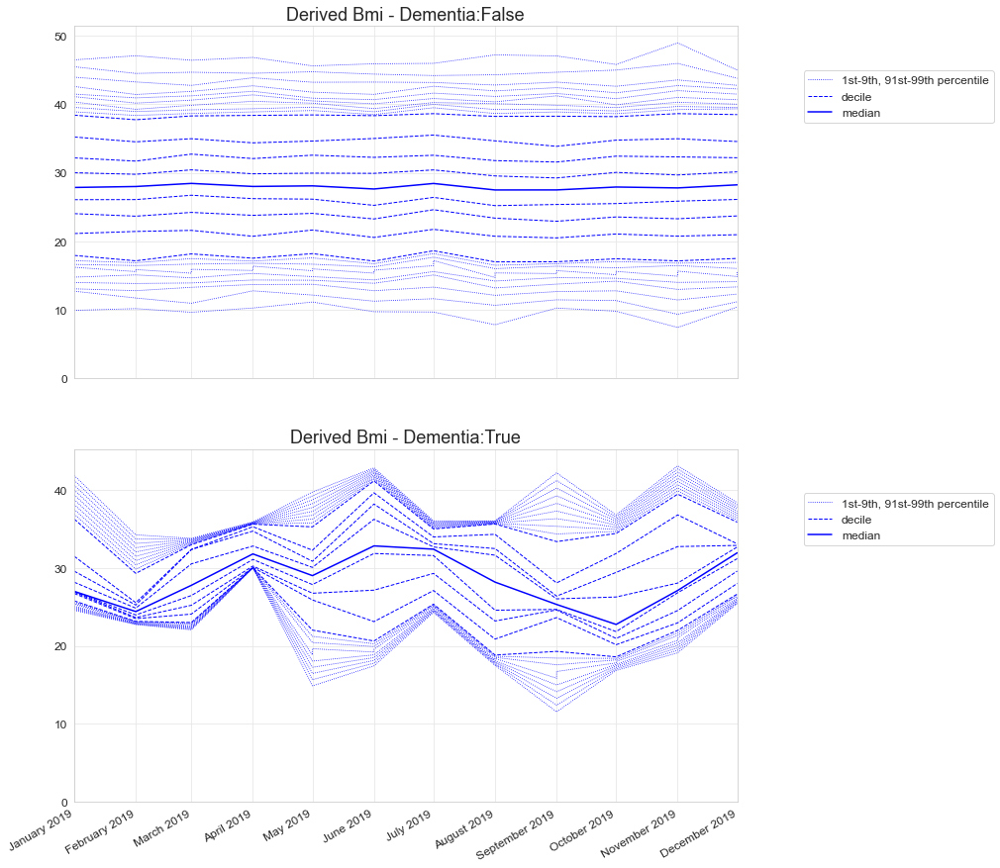

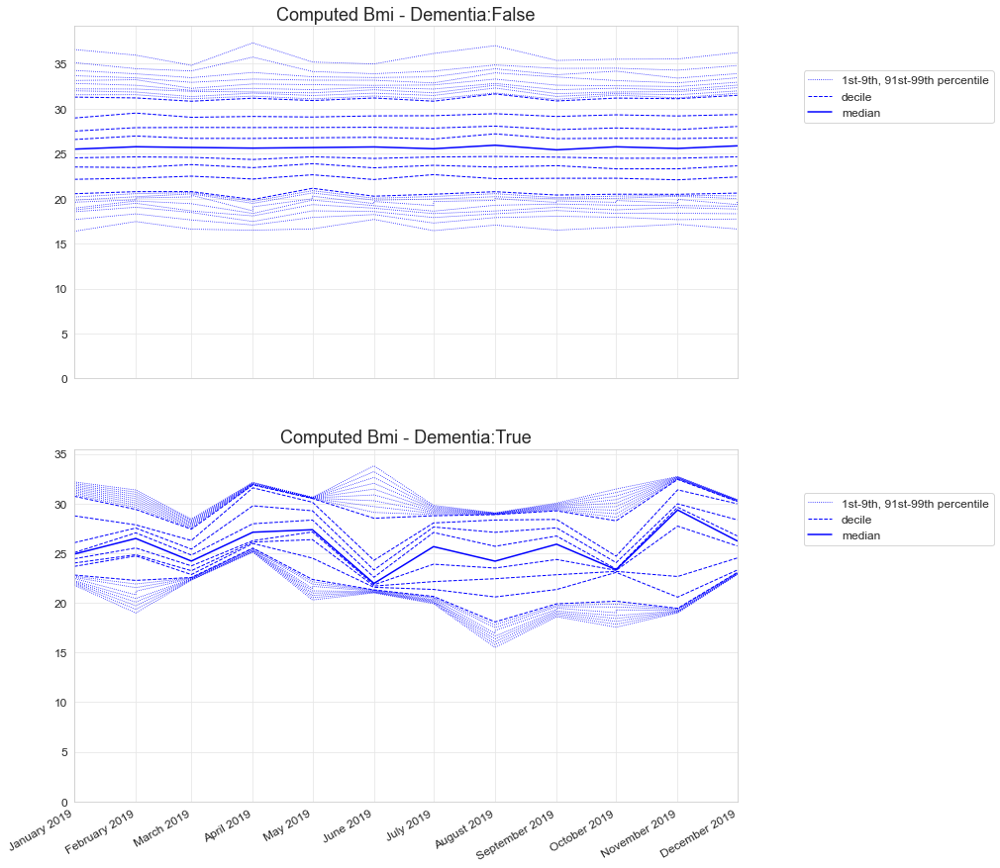

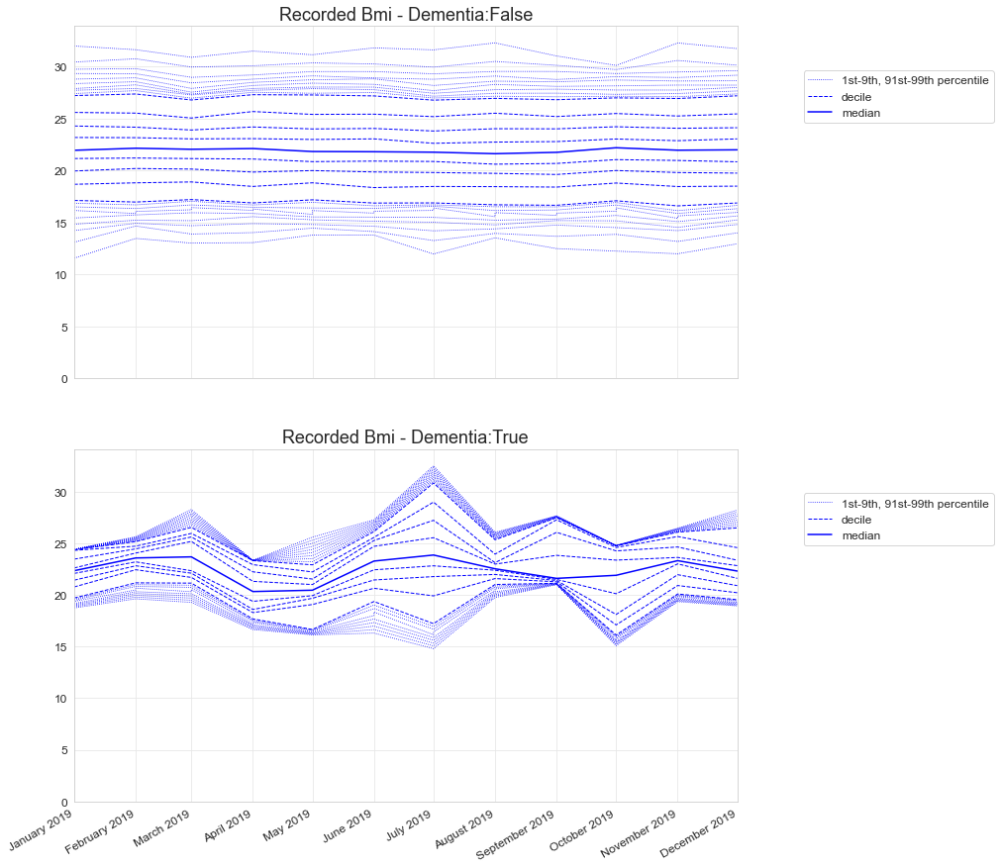

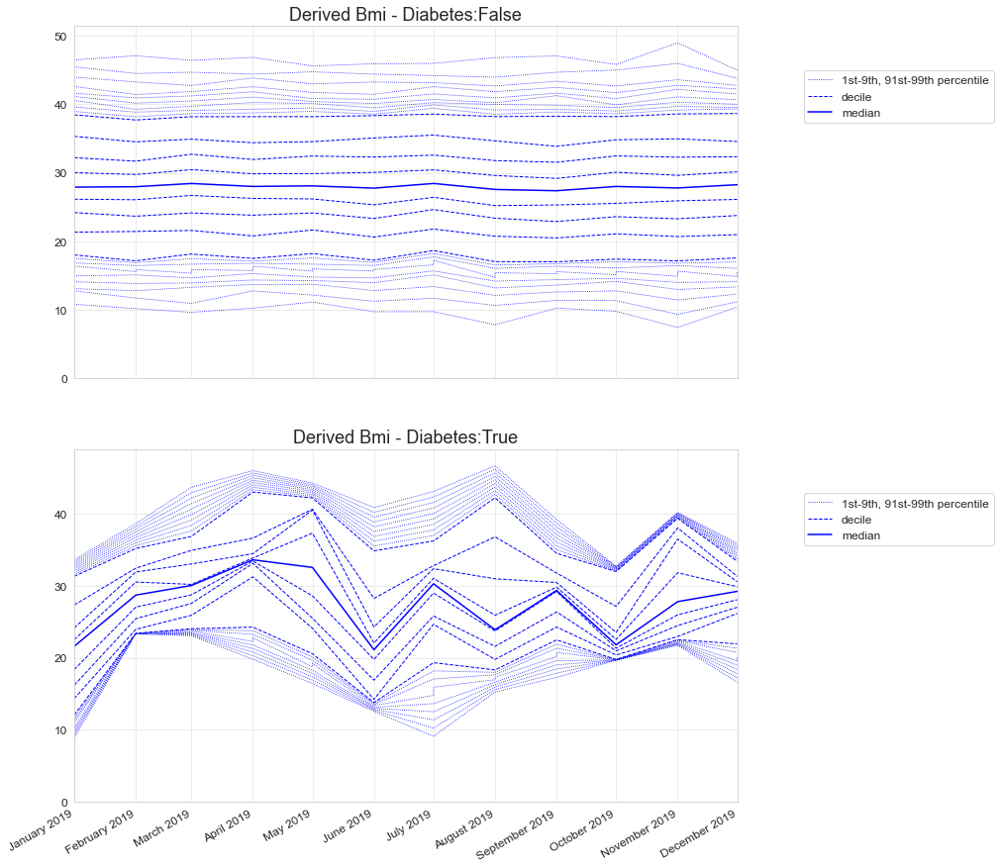

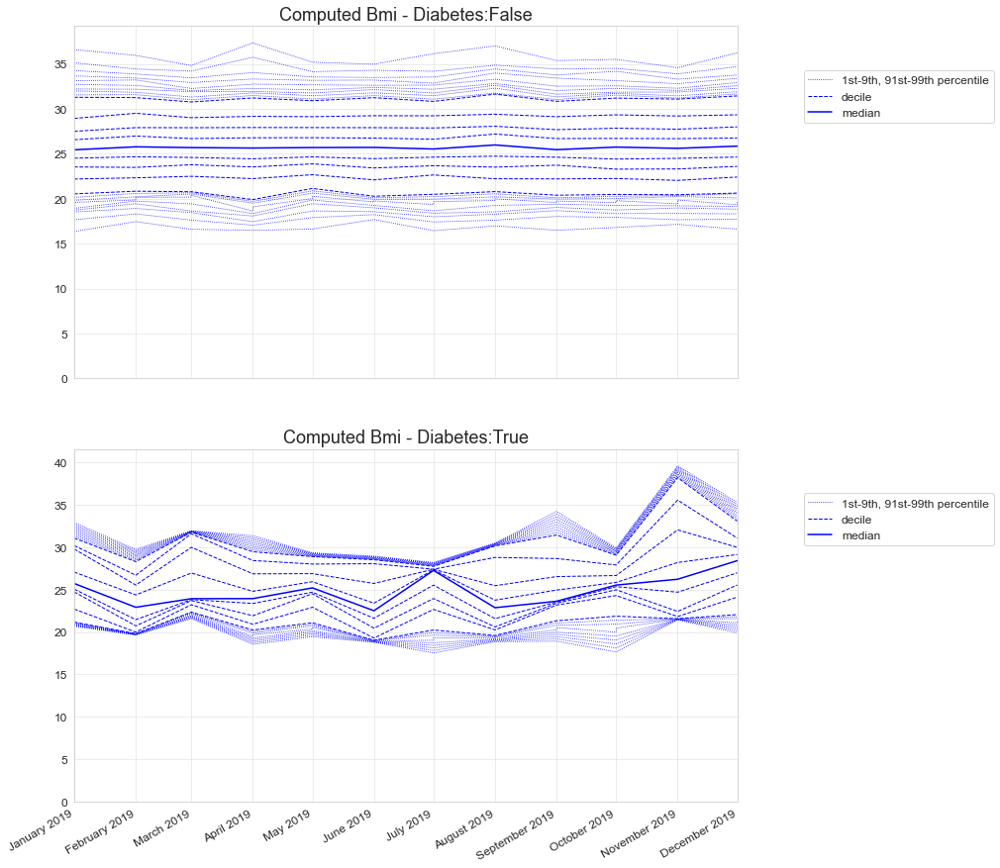

...

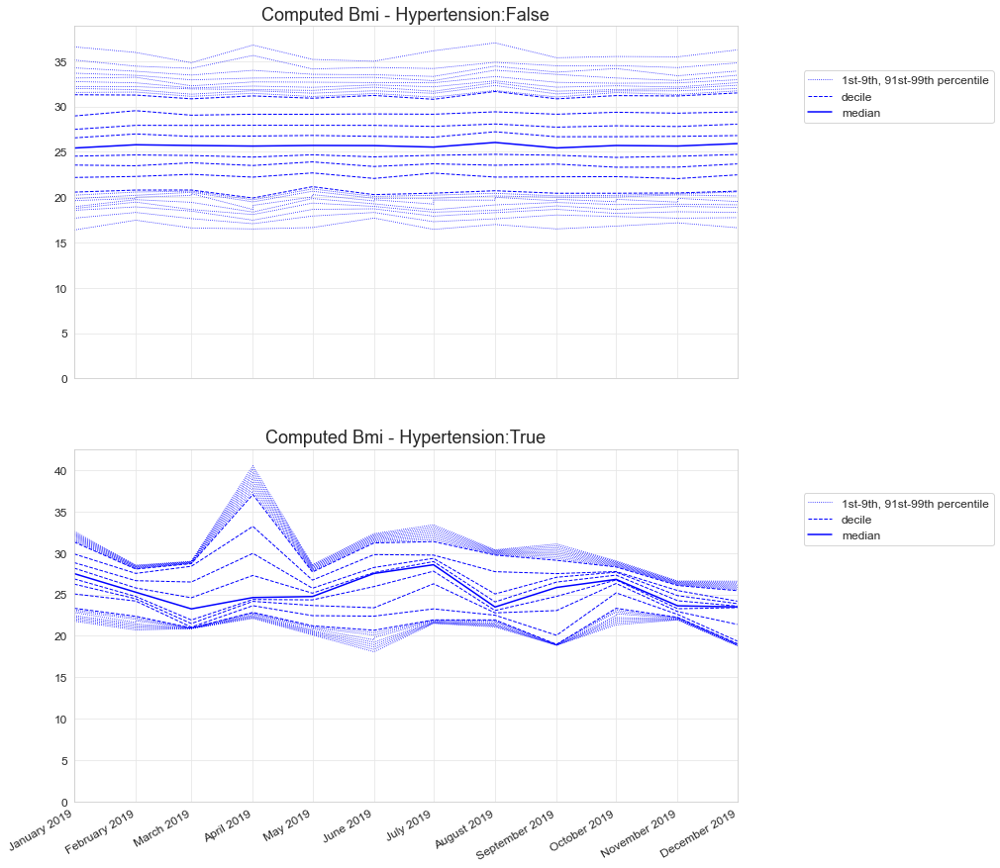

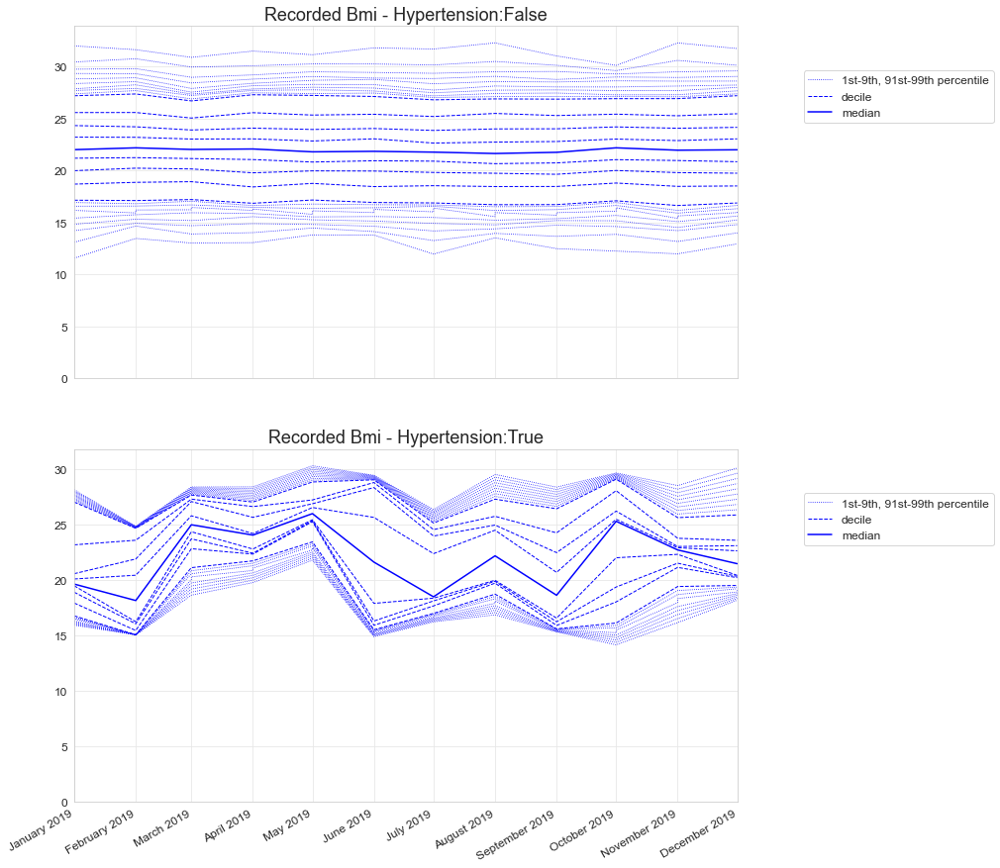

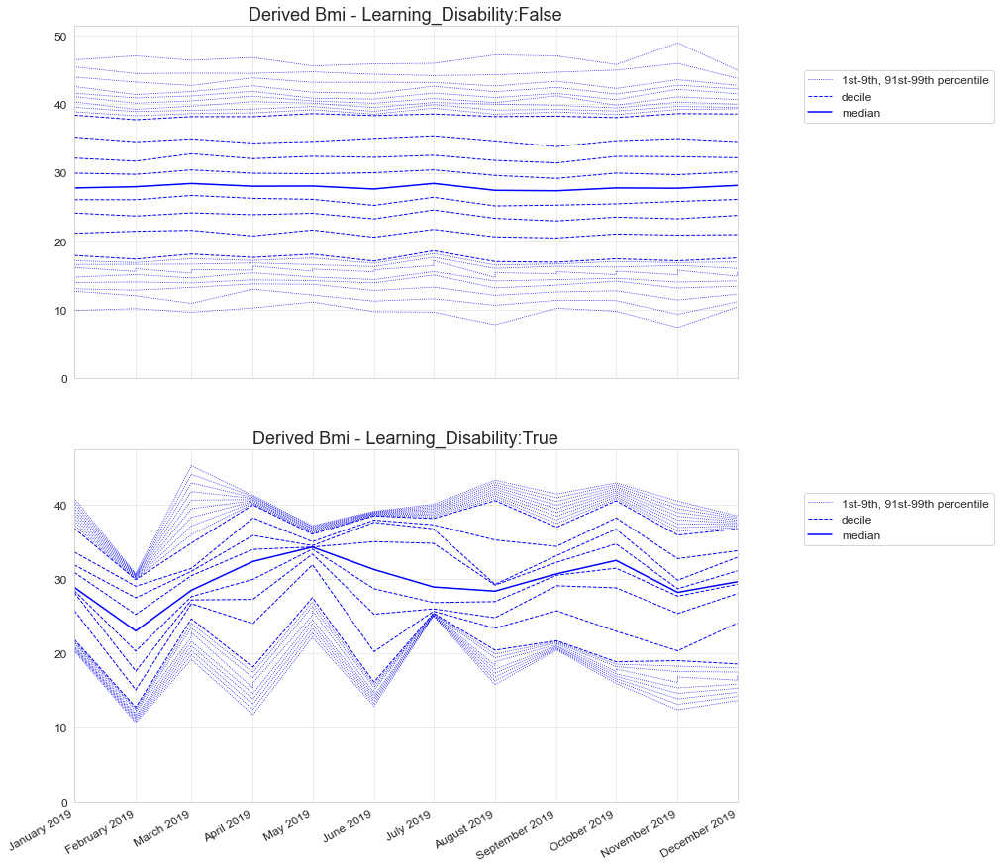

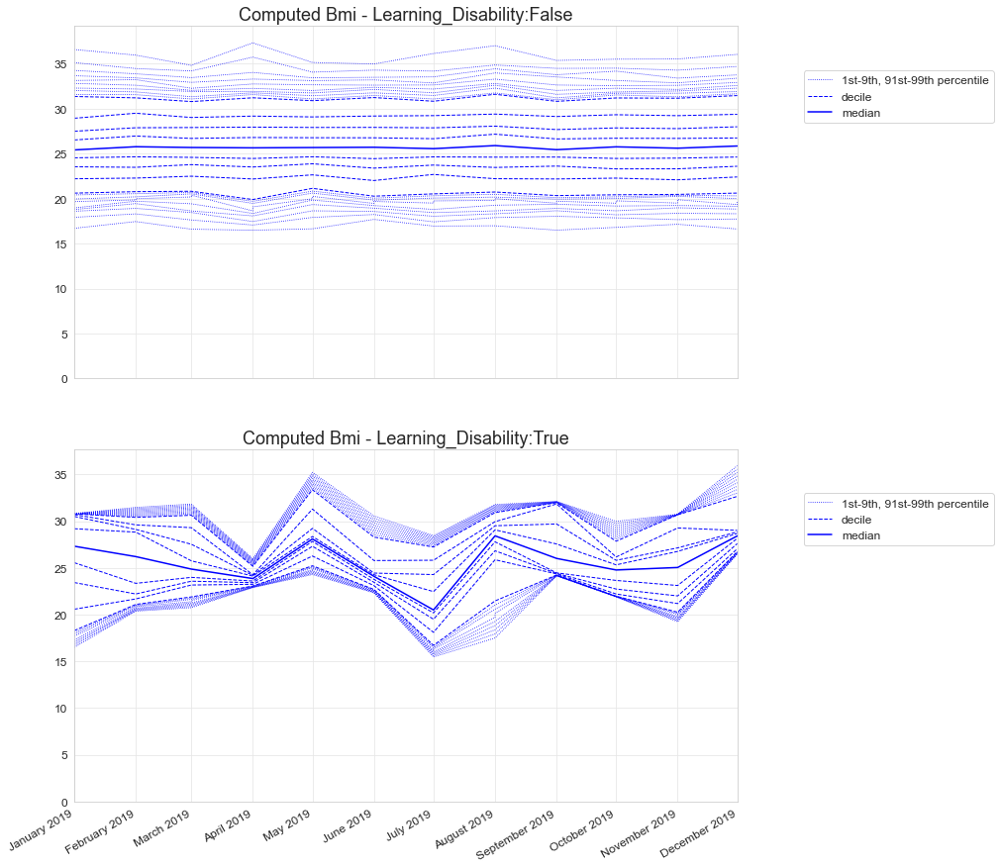

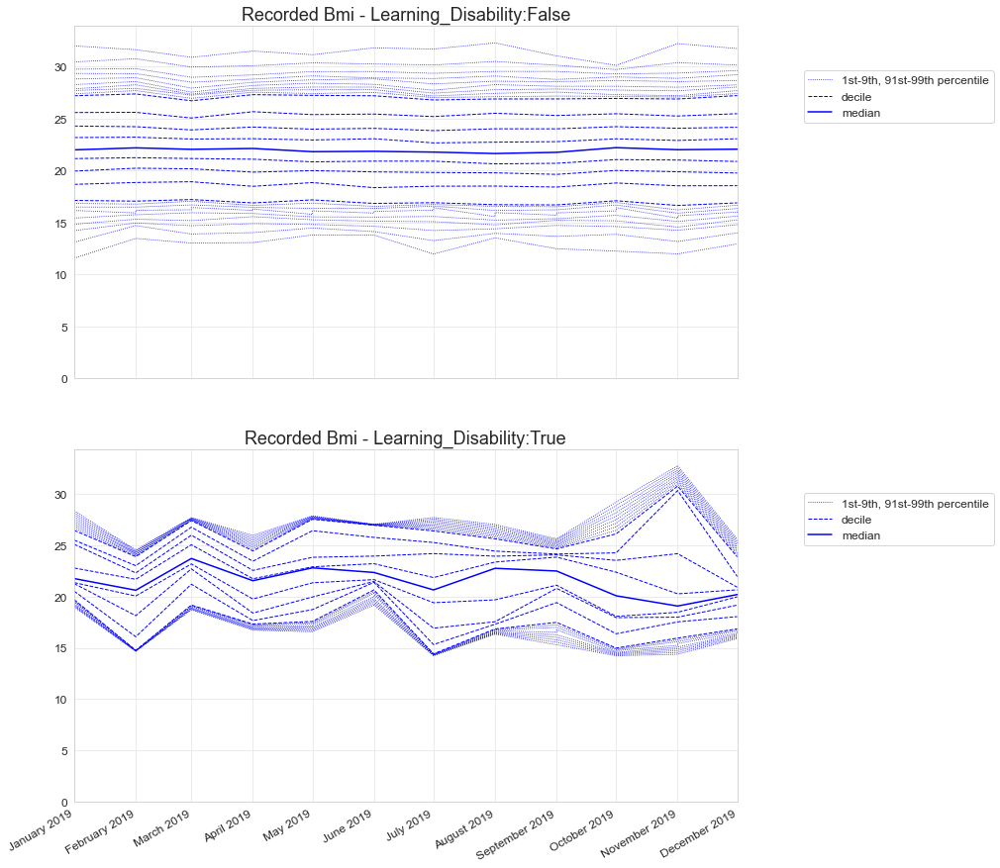

In [27]:
for group in clinical_covariates:
    measure_over_time(df_occ, definitions, group)

#### Comparison Across Definitions
    

,comparison,num_equal,num_diff,avg_diff
0,derived_bmi_computed_bmi,0.0,9612.0,7.451674
1,derived_bmi_recorded_bmi,0.0,12000.0,8.706401
2,computed_bmi_recorded_bmi,0.0,9612.0,5.579706


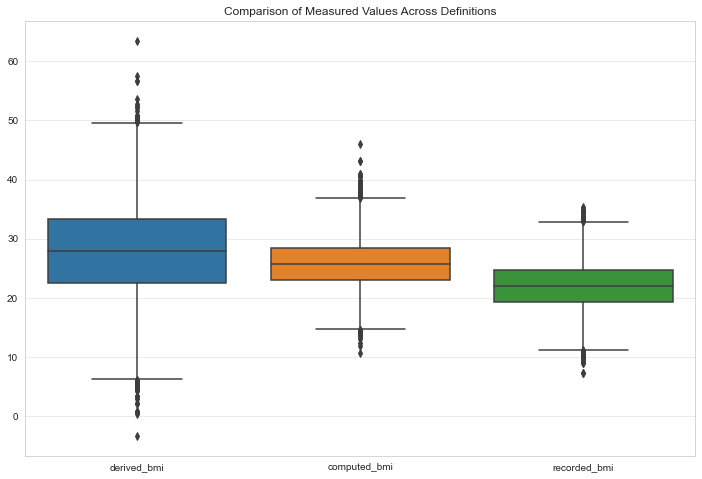

,comparison,age_band,num_equal,num_diff,avg_diff
0,derived_bmi_computed_bmi,0-19,0.0,1214.0,7.475247
1,derived_bmi_computed_bmi,20-29,0.0,1198.0,7.694103
2,derived_bmi_computed_bmi,30-39,0.0,1161.0,7.680019
3,derived_bmi_computed_bmi,40-49,0.0,1167.0,7.233657
4,derived_bmi_computed_bmi,50-59,0.0,1261.0,7.041271
5,derived_bmi_computed_bmi,60-69,0.0,1273.0,7.702188
6,derived_bmi_computed_bmi,70-79,0.0,1141.0,7.376709
7,derived_bmi_computed_bmi,80+,0.0,1197.0,7.423487
8,derived_bmi_recorded_bmi,0-19,0.0,1552.0,8.810245
9,derived_bmi_recorded_bmi,20-29,0.0,1498.0,8.799891


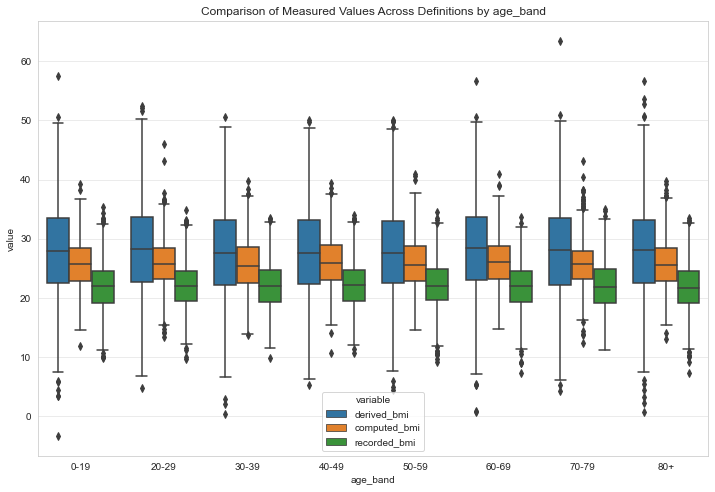

,comparison,sex,num_equal,num_diff,avg_diff
0,derived_bmi_computed_bmi,F,0.0,4752.0,7.457588
1,derived_bmi_computed_bmi,M,0.0,4860.0,7.445743
2,derived_bmi_recorded_bmi,F,0.0,5944.0,8.767755
3,derived_bmi_recorded_bmi,M,0.0,6056.0,8.645286
4,computed_bmi_recorded_bmi,F,0.0,4752.0,5.602077
5,computed_bmi_recorded_bmi,M,0.0,4860.0,5.557782


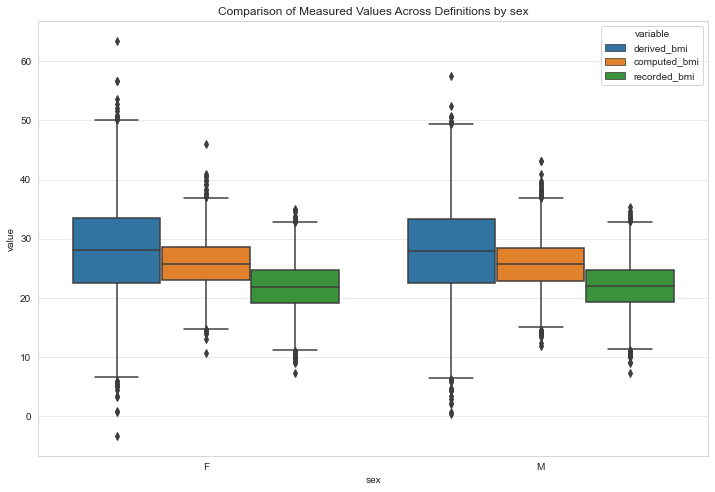

,comparison,ethnicity,num_equal,num_diff,avg_diff
0,derived_bmi_computed_bmi,1,0.0,516.0,7.722692
1,derived_bmi_computed_bmi,2,0.0,231.0,7.375223
2,derived_bmi_computed_bmi,3,0.0,125.0,6.650807
3,derived_bmi_computed_bmi,4,0.0,69.0,8.188684
4,derived_bmi_computed_bmi,5,0.0,49.0,7.256850
5,derived_bmi_computed_bmi,6,0.0,13.0,9.847273
6,derived_bmi_computed_bmi,7,0.0,3.0,4.774163
7,derived_bmi_computed_bmi,8,0.0,6.0,5.126909
8,derived_bmi_recorded_bmi,1,0.0,646.0,9.060043
9,derived_bmi_recorded_bmi,2,0.0,292.0,8.834617


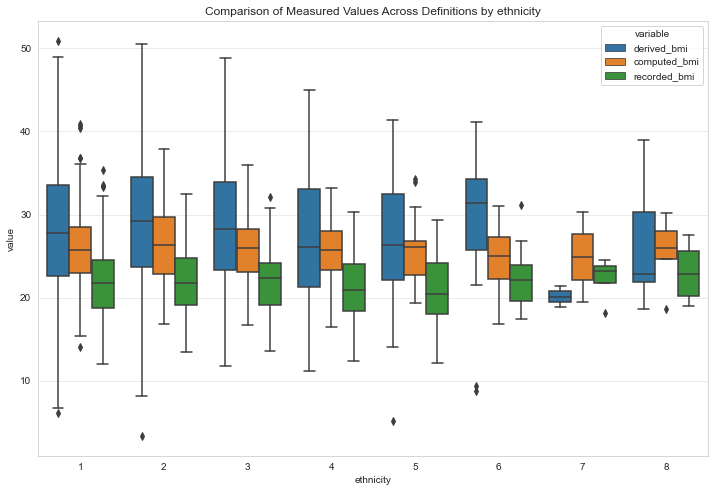

,comparison,region,num_equal,num_diff,avg_diff
0,derived_bmi_computed_bmi,East Midlands,0.0,632.0,7.144414
1,derived_bmi_computed_bmi,East of England,0.0,580.0,7.095597
2,derived_bmi_computed_bmi,London,0.0,1191.0,7.283562
3,derived_bmi_computed_bmi,North East,0.0,641.0,7.245629
4,derived_bmi_computed_bmi,North West,0.0,669.0,7.095005
5,derived_bmi_computed_bmi,South East,0.0,1290.0,7.987127
6,derived_bmi_computed_bmi,West Midlands,0.0,642.0,7.576031
7,derived_bmi_computed_bmi,Yorkshire and the Humber,0.0,573.0,7.586518
8,derived_bmi_recorded_bmi,East Midlands,0.0,784.0,8.425515
9,derived_bmi_recorded_bmi,East of England,0.0,739.0,8.205794


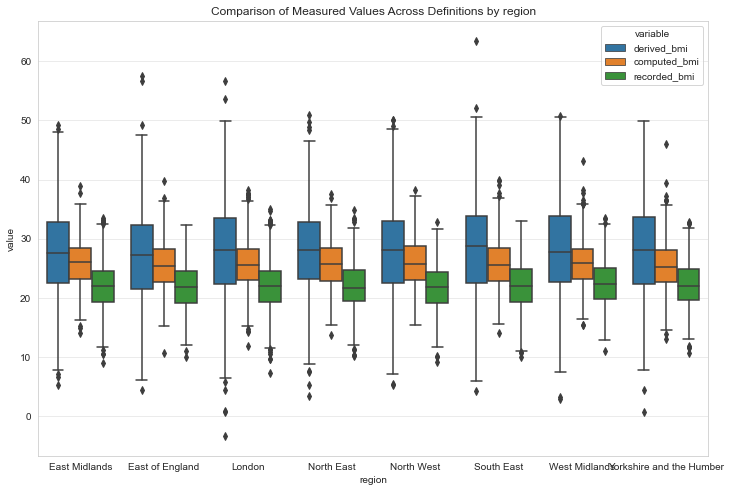

,comparison,imd,num_equal,num_diff,avg_diff
0,derived_bmi_computed_bmi,100,0.0,1831.0,7.394770
1,derived_bmi_computed_bmi,200,0.0,1940.0,7.347836
2,derived_bmi_computed_bmi,300,0.0,1969.0,7.482828
3,derived_bmi_computed_bmi,400,0.0,1920.0,7.523310
4,derived_bmi_computed_bmi,500,0.0,1952.0,7.510556
5,derived_bmi_recorded_bmi,100,0.0,2297.0,8.581809
6,derived_bmi_recorded_bmi,200,0.0,2408.0,8.774848
7,derived_bmi_recorded_bmi,300,0.0,2430.0,8.882129
8,derived_bmi_recorded_bmi,400,0.0,2425.0,8.503597
9,derived_bmi_recorded_bmi,500,0.0,2440.0,8.775949


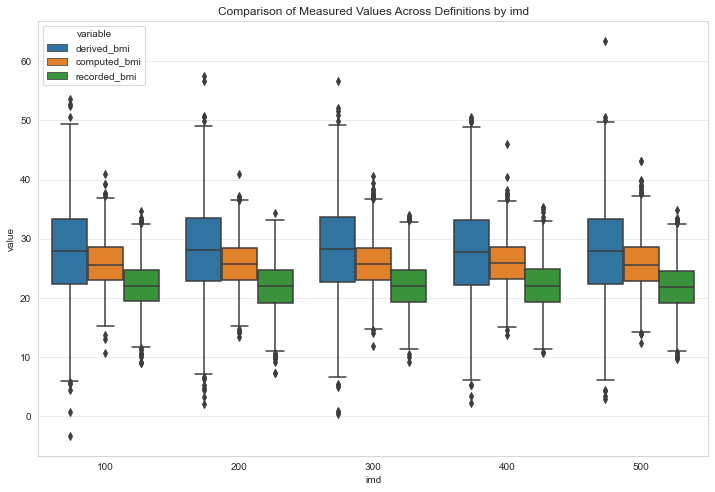

,comparison,dementia,num_equal,num_diff,avg_diff
0,derived_bmi_computed_bmi,False,0.0,9515.0,7.464661
1,derived_bmi_computed_bmi,True,0.0,97.0,6.185985
2,derived_bmi_recorded_bmi,False,0.0,11880.0,8.709711
3,derived_bmi_recorded_bmi,True,0.0,120.0,8.329487
4,computed_bmi_recorded_bmi,False,0.0,9515.0,5.584679
5,computed_bmi_recorded_bmi,True,0.0,97.0,5.029351


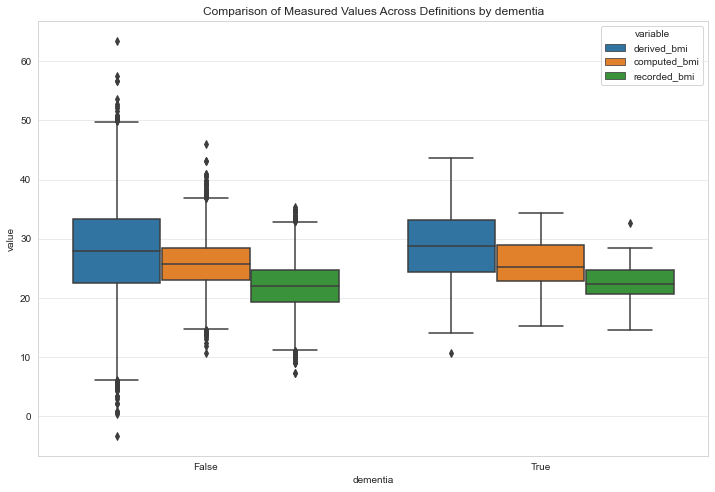

,comparison,diabetes,num_equal,num_diff,avg_diff
0,derived_bmi_computed_bmi,False,0.0,9516.0,7.436155
1,derived_bmi_computed_bmi,True,0.0,96.0,8.719722
2,derived_bmi_recorded_bmi,False,0.0,11880.0,8.698159
3,derived_bmi_recorded_bmi,True,0.0,120.0,9.481388
4,computed_bmi_recorded_bmi,False,0.0,9516.0,5.582342
5,computed_bmi_recorded_bmi,True,0.0,96.0,5.344234


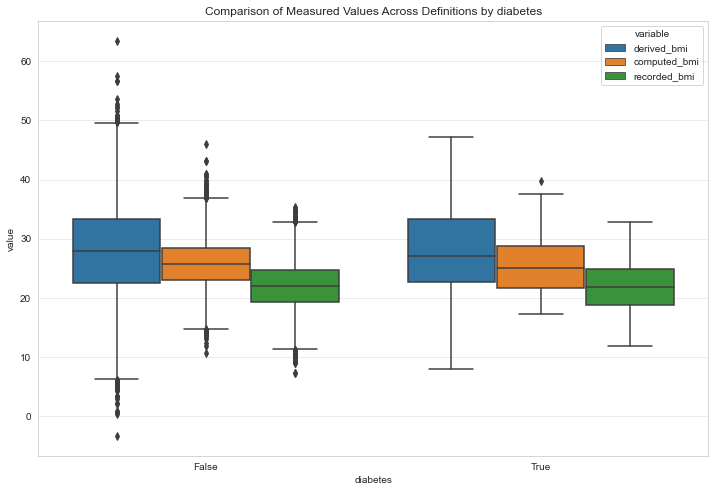

,comparison,hypertension,num_equal,num_diff,avg_diff
0,derived_bmi_computed_bmi,False,0.0,9517.0,7.443765
1,derived_bmi_computed_bmi,True,0.0,95.0,8.275259
2,derived_bmi_recorded_bmi,False,0.0,11880.0,8.699115
3,derived_bmi_recorded_bmi,True,0.0,120.0,9.457008
4,computed_bmi_recorded_bmi,False,0.0,9517.0,5.581265
5,computed_bmi_recorded_bmi,True,0.0,95.0,5.410224


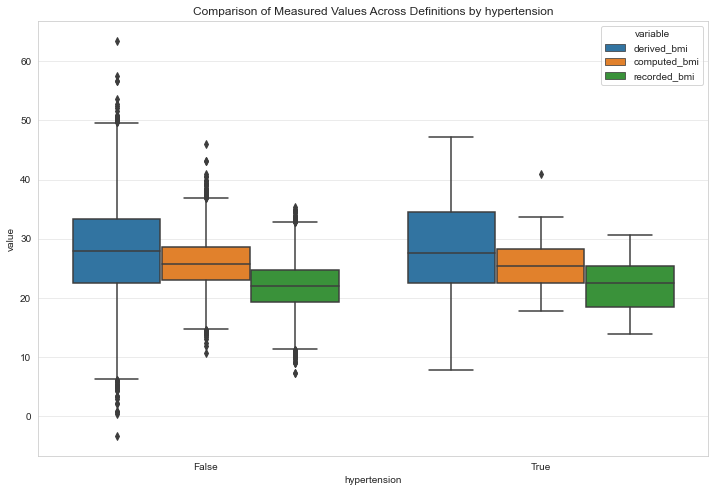

,comparison,learning_disability,num_equal,num_diff,avg_diff
0,derived_bmi_computed_bmi,False,0.0,9514.0,7.457188
1,derived_bmi_computed_bmi,True,0.0,98.0,6.905489
2,derived_bmi_recorded_bmi,False,0.0,11880.0,8.689329
3,derived_bmi_recorded_bmi,True,0.0,120.0,10.235287
4,computed_bmi_recorded_bmi,False,0.0,9514.0,5.567667
5,computed_bmi_recorded_bmi,True,0.0,98.0,6.687972


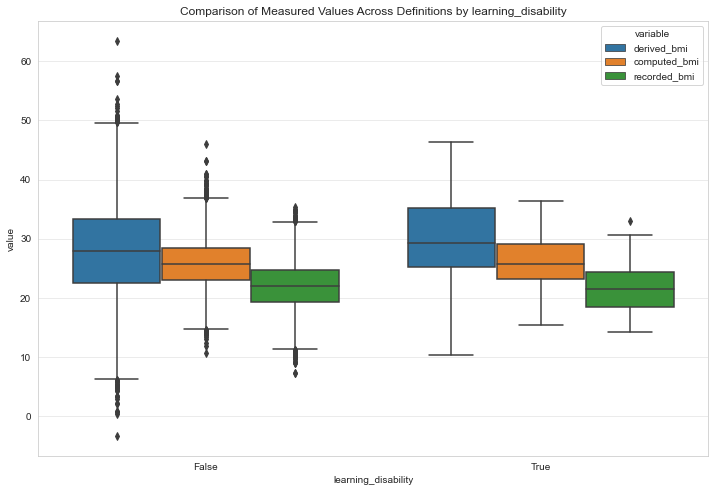

In [28]:
# Comparison only runs if more than 1 definition provided
if num_definitions > 1: 
    display(Markdown("""#### Comparison Across Definitions
    """))
    
    compare_value(df_occ, definitions)
    
    for group in demographic_covariates:
        compare_value(df_occ, definitions, group)
    
    for group in clinical_covariates:
        compare_value(df_occ, definitions, group)

## Discussion

<font color='red'>To fill.</font>

The purpose of this live report is to bring a systematic approach to creating, documenting, cross-checking, and sharing variables to improve analyses in OpenSAFELY-TPP. If you have improvements or edits to this report, please contact <font color='red'>owner</font>.